
#### ML Project

In [151]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.model_selection import TimeSeriesSplit,train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import umap
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
import random
random.seed(1)
from sklearn.model_selection import GridSearchCV

# Model
from neuralprophet import NeuralProphet, set_log_level
# Disable logging messages unless error
set_log_level('ERROR')

# Reproducibility
from neuralprophet import set_random_seed
set_random_seed(1)

from statsmodels.graphics.tsaplots import plot_acf


In [56]:
# Load the dataset
data = pd.read_csv('Walmart.csv')

In [57]:
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,5/2/10,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12/2/10,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,5/3/10,1554806.68,0,46.50,2.625,211.350143,8.106


In [58]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [59]:
# Convert Date from object to datetime
data['Date'] = pd.to_datetime(data['Date'])

WARNING - (py.warnings._showwarnmsg) - /var/folders/wx/twq6z36s4jx_wkqw7ym9cwdm0000gn/T/ipykernel_10330/2915031550.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data['Date'] = pd.to_datetime(data['Date'])



In [60]:
# Convert the store form int to object
data['Store'] = data['Store'].astype(str)

In [61]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   object        
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(1)
memory usage: 402.3+ KB


In [62]:
store_list = data['Store'].unique()

In [63]:
# Check for missing values
missing_values = data.isnull().sum()
print(missing_values)


Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64


<Axes: xlabel='Date'>

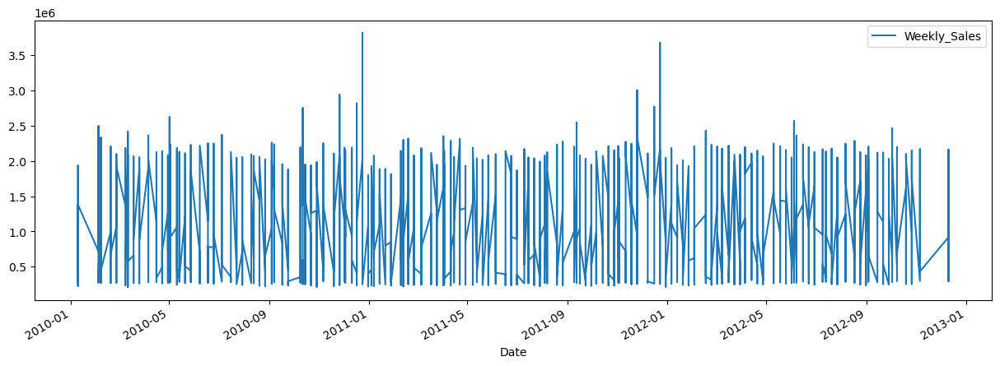

In [64]:
# Plot
data.plot(x='Date',y='Weekly_Sales',figsize=(15,5))

WARNING - (py.warnings._showwarnmsg) - /var/folders/wx/twq6z36s4jx_wkqw7ym9cwdm0000gn/T/ipykernel_10330/2416318827.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(figsize=(15,5))



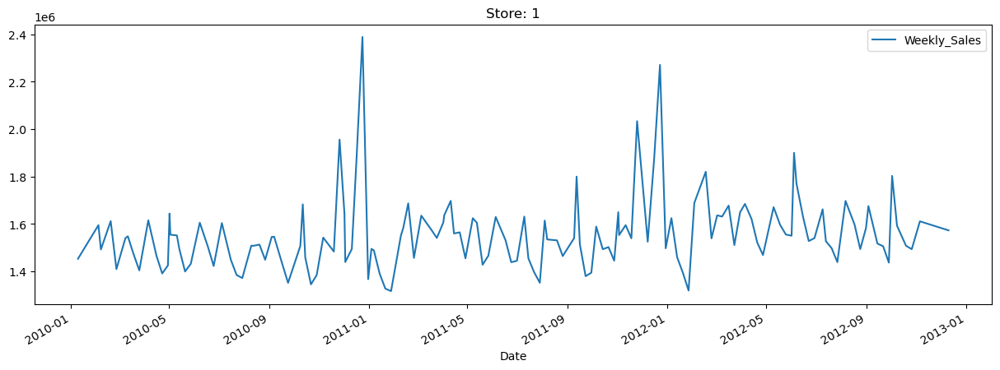

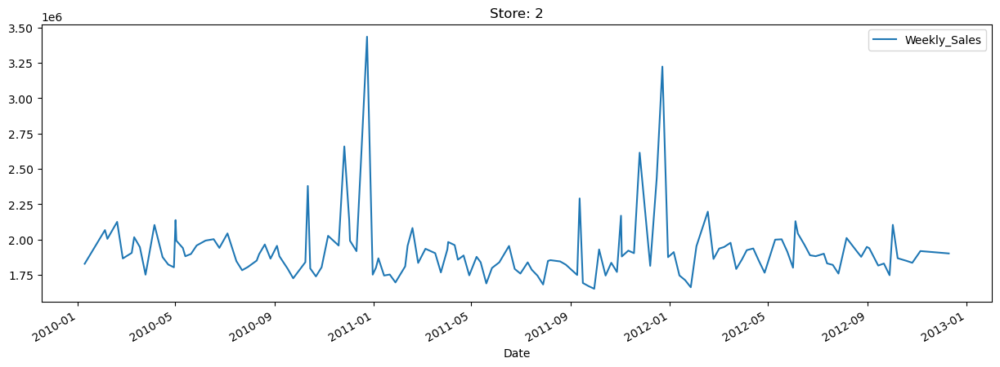

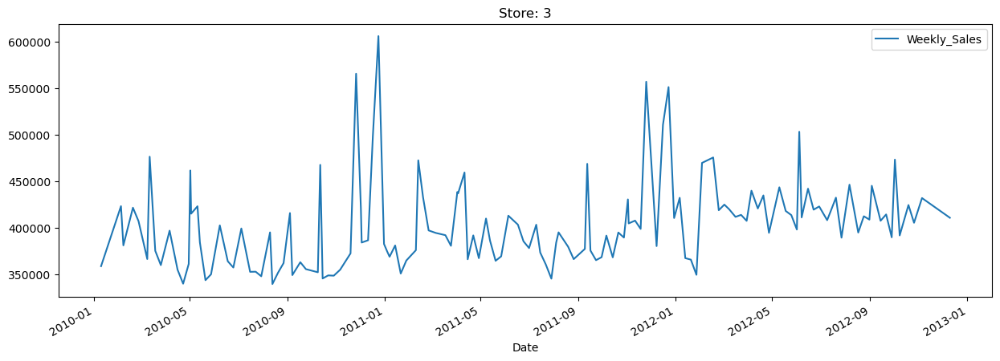

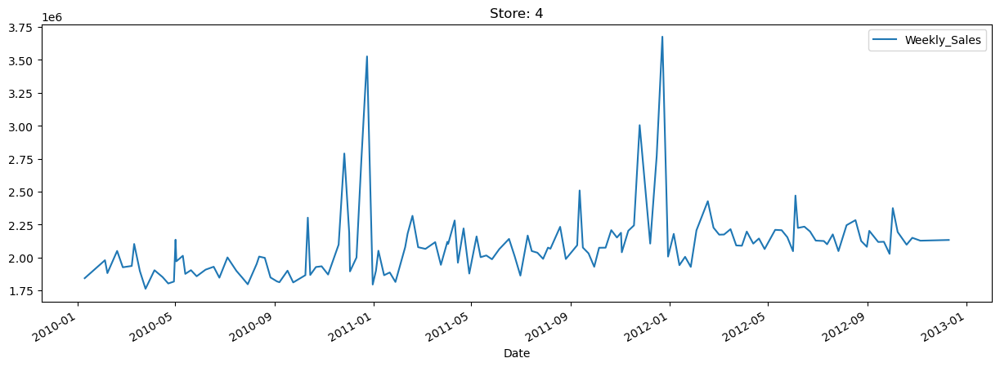

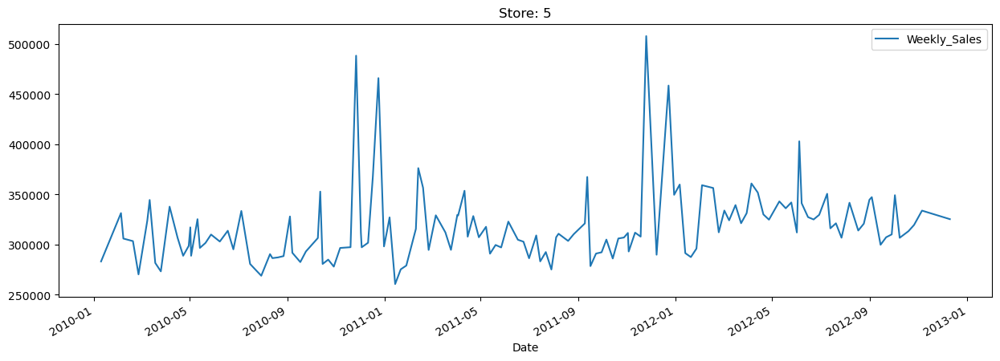

...

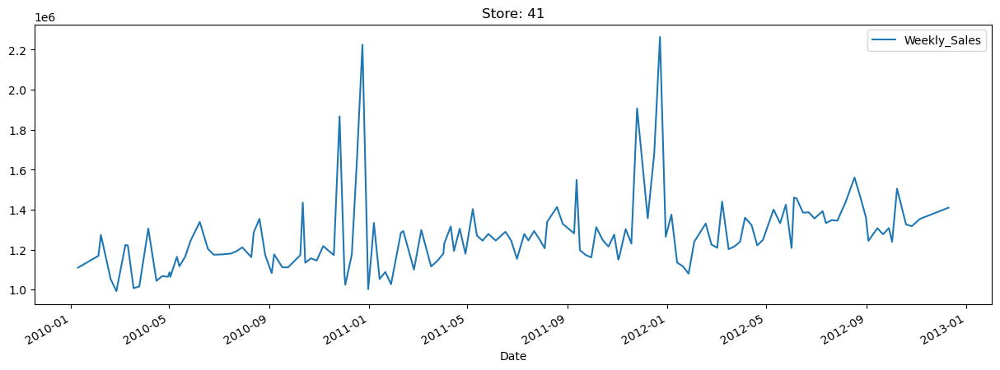

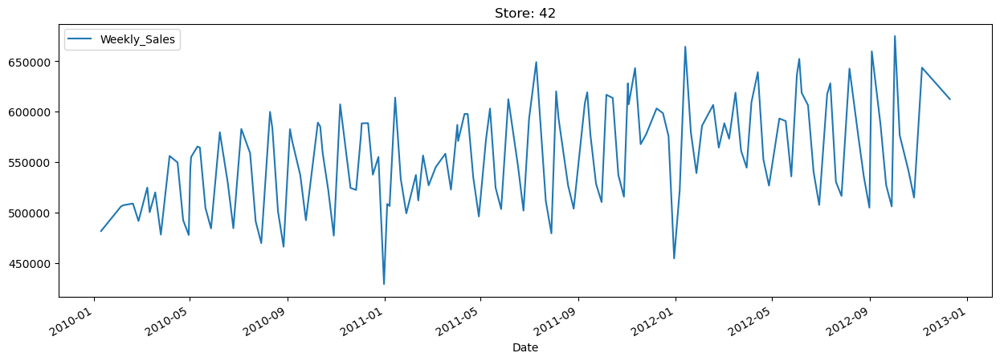

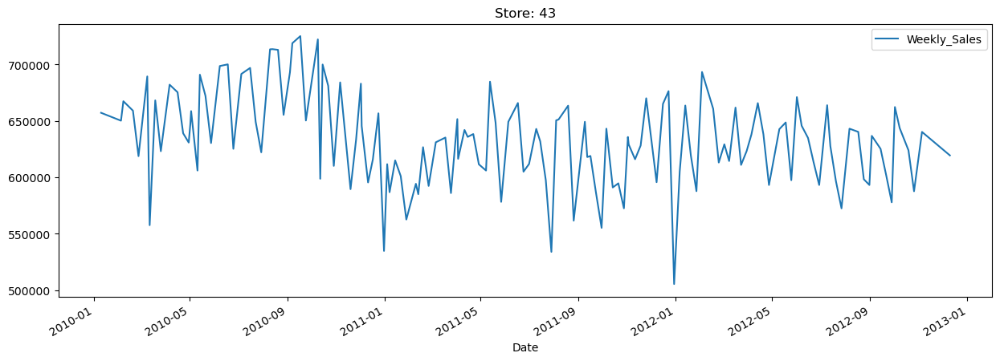

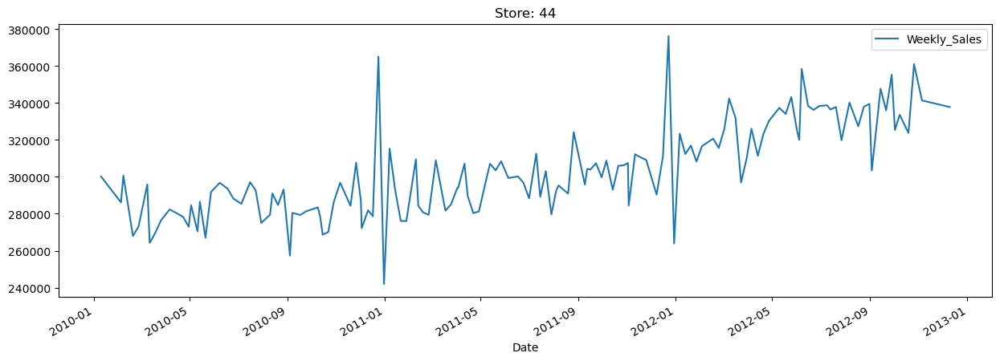

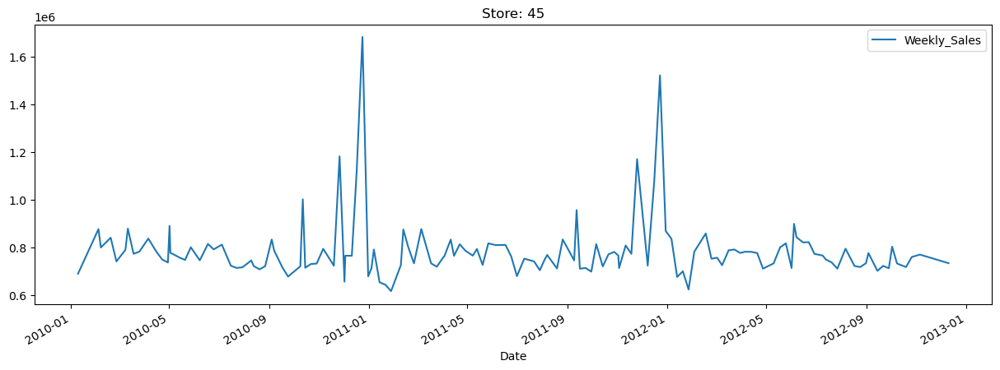

In [65]:
# lets plot each branch data to find any discripency

for i in store_list:
    fig,ax = plt.subplots(figsize=(15,5))
    dfx = data.query('Store==@i')
    dfx.plot(x='Date',y='Weekly_Sales',ax=ax,title= "Store: "+i)
    plt.plot()

#### Review:
IF we could see here, most of the store sales are in Millions and most stores show a sudden spike in late december which shows clear indications of high holiday sales. So we need to keep this inaccount becuase this sudden spike may be treated as outliers by the model.

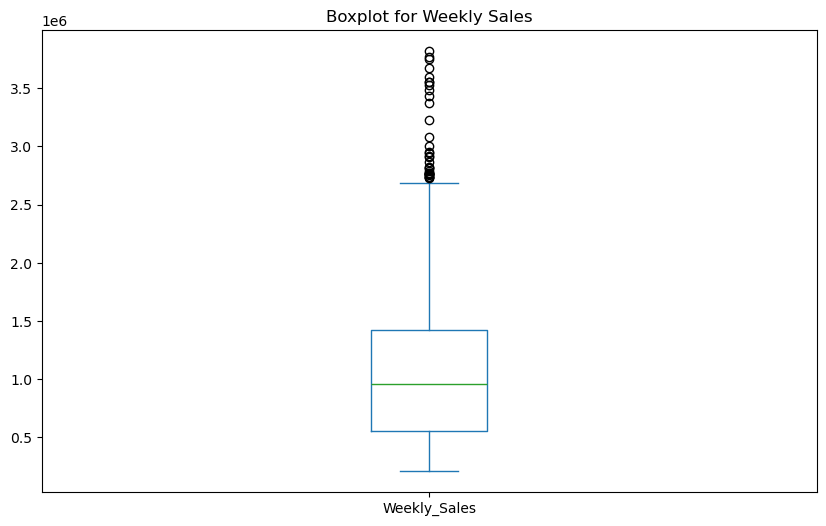

In [66]:

# Boxplot for Weekly_Sales
plt.figure(figsize=(10, 6))
data['Weekly_Sales'].plot(kind='box')
plt.title('Boxplot for Weekly Sales')
plt.show()

# Calculate IQR and identify outliers
Q1 = data['Weekly_Sales'].quantile(0.25)
Q3 = data['Weekly_Sales'].quantile(0.75)
IQR = Q3 - Q1
outliers = data[(data['Weekly_Sales'] < (Q1 - 1.5 * IQR)) | (data['Weekly_Sales'] > (Q3 + 1.5 * IQR))]


In [67]:
IQR

866808.5549999999

In [68]:
outliers

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
189,2,2010-12-24,3436007.68,0,49.97,2.886,211.064660,8.163
241,2,2011-12-23,3224369.80,0,46.66,3.112,218.999550,7.441
471,4,2010-11-26,2789469.45,1,48.08,2.752,126.669267,7.127
474,4,2010-12-17,2740057.14,0,46.57,2.884,126.879484,7.127
475,4,2010-12-24,3526713.39,0,43.21,2.887,126.983581,7.127
523,4,2011-11-25,3004702.33,1,47.96,3.225,129.836400,5.143
526,4,2011-12-16,2771397.17,0,36.44,3.149,129.898065,5.143
527,4,2011-12-23,3676388.98,0,35.92,3.103,129.984548,5.143
761,6,2010-12-24,2727575.18,0,55.07,2.886,212.916508,7.007
1329,10,2010-11-26,2939946.38,1,55.33,3.162,126.669267,9.003


Our assumption is true, in December we have many outliers beacuse of holiday season

In [69]:
# Summary statistics
summary_statistics = data.describe()
print(summary_statistics)


                                Date  Weekly_Sales  Holiday_Flag  Temperature  \
count                           6435  6.435000e+03   6435.000000  6435.000000   
mean   2011-06-17 20:18:27.692307712  1.046965e+06      0.069930    60.663782   
min              2010-01-10 00:00:00  2.099862e+05      0.000000    -2.060000   
25%              2010-10-12 00:00:00  5.533501e+05      0.000000    47.460000   
50%              2011-06-17 00:00:00  9.607460e+05      0.000000    62.670000   
75%              2012-03-02 00:00:00  1.420159e+06      0.000000    74.940000   
max              2012-12-10 00:00:00  3.818686e+06      1.000000   100.140000   
std                              NaN  5.643666e+05      0.255049    18.444933   

        Fuel_Price          CPI  Unemployment  
count  6435.000000  6435.000000   6435.000000  
mean      3.358607   171.578394      7.999151  
min       2.472000   126.064000      3.879000  
25%       2.933000   131.735000      6.891000  
50%       3.445000   182.61652

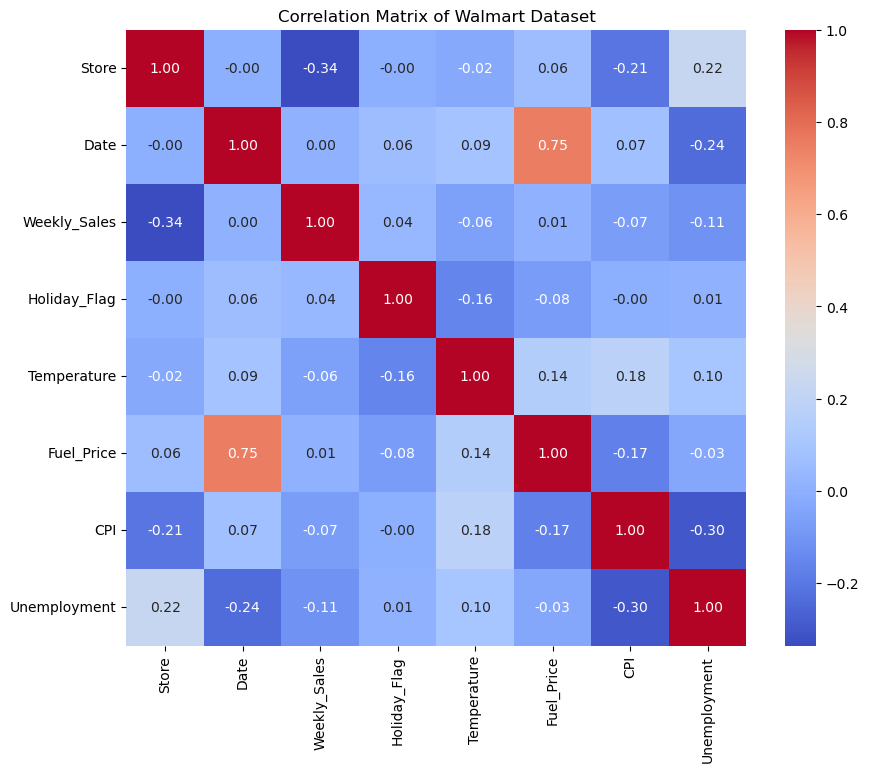

In [70]:
# Calculate the correlation matrix
corr_matrix = data.corr()

# Plot the correlation matrix using seaborn's heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Correlation Matrix of Walmart Dataset')
plt.show()

#### Review:
Some Important observations are:
Weekly_Sales and Store: There is a moderate negative correlation, suggesting that sales may differ across stores, and certain stores may consistently have higher or lower sales.
Fuel_Price and Date: There is a strong positive correlation, which may indicate that over time, fuel prices have been increasing.
CPI and Unemployment: There is a moderate negative correlation, indicating that as CPI increases, unemployment tends to decrease, or vice versa. This could be due to economic growth leading to increased consumer prices and reduced unemployment.
Holiday_Flag doesn't seem to have a strong correlation with Weekly_Sales: This suggests that holidays might not have a significant impact on sales, which could be counterintuitive and may warrant further investigation.


#### Dimentionality reduction.
Generally PCA is perfomed for high dimension Dataset to identify most importnat variables. 

In [71]:
# Let's remove non-numeric columns first
numeric_data = data.select_dtypes(include=[np.number])

In [72]:
numeric_data.head()

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1643690.90,0,42.31,2.572,211.096358,8.106
1,1641957.44,1,38.51,2.548,211.242170,8.106
2,1611968.17,0,39.93,2.514,211.289143,8.106
3,1409727.59,0,46.63,2.561,211.319643,8.106
4,1554806.68,0,46.50,2.625,211.350143,8.106


In [73]:
# Standardize the data before applying PCA
scaler = StandardScaler()
numeric_scaled = scaler.fit_transform(numeric_data)

In [74]:
# Apply PCA
pca = PCA(n_components=2)  # reduce to two components for visualization
pca_result = pca.fit_transform(numeric_scaled)

In [75]:
pca_result

array([[-1.11960751,  1.30591778],
       [-1.15143049,  3.48540533],
       [-1.14807236,  1.42357704],
       ...,
       [ 0.25781019, -0.71823871],
       [ 0.2312192 , -0.77628877],
       [ 0.16796669, -0.77282114]])

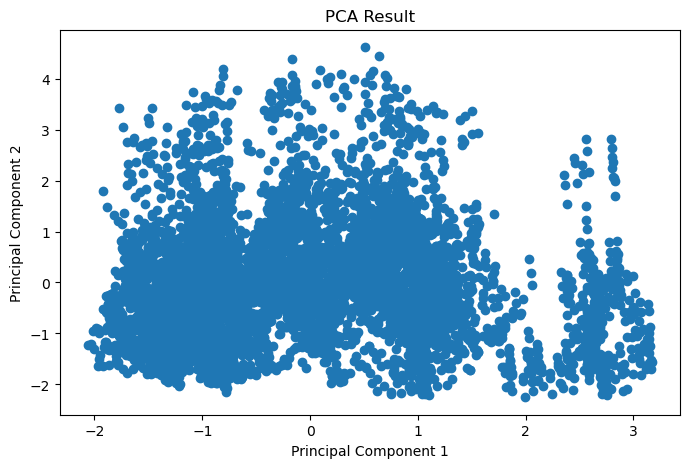

In [76]:
# Create a scatter plot of the first two principal components
plt.figure(figsize=(8, 5))
plt.scatter(pca_result[:, 0], pca_result[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Result')
plt.show()

In [176]:
pca.components_  # The components (principal axes)


array([[-0.0146174 , -0.00762228, -0.07448674,  0.27938844, -0.73351275,
         0.614883  ],
       [ 0.2949854 ,  0.51526927, -0.68594567, -0.36851689, -0.1720483 ,
        -0.10749146]])

In [77]:
# We will use the same `numeric_scaled` data that was scaled for PCA
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=0)  # reduce to two components for visualization
tsne_result = tsne.fit_transform(numeric_scaled)

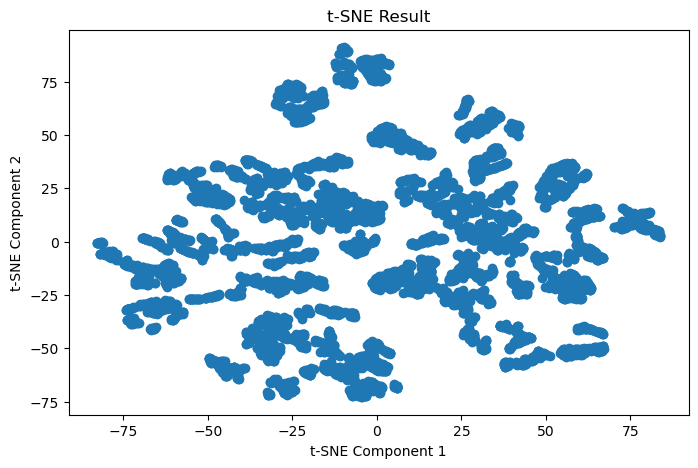

In [78]:
# Create a scatter plot of the first two t-SNE components
plt.figure(figsize=(8, 5))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1])
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Result')
plt.show()

In [79]:
# We will use the same `numeric_scaled` data that was scaled for PCA
# Apply UMAP
reducer = umap.UMAP()
umap_result = reducer.fit_transform(numeric_scaled)

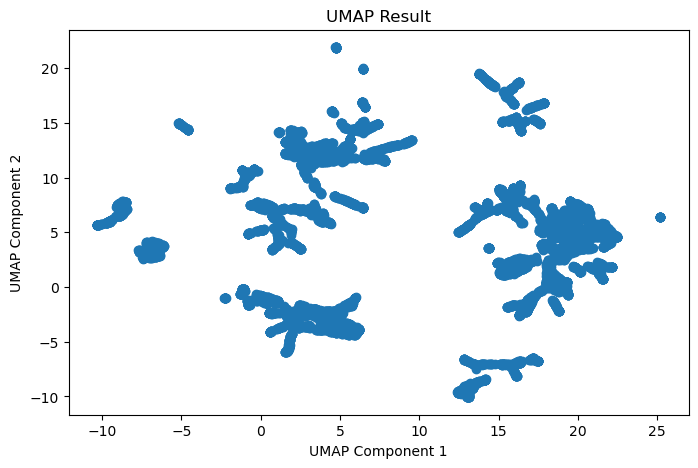

In [80]:
# Create a scatter plot of the first two UMAP components
plt.figure(figsize=(8, 5))
plt.scatter(umap_result[:, 0], umap_result[:, 1])
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP Result')
plt.show()

#### Review:
The visualizations from PCA, t-SNE, and UMAP each provide a different perspective on the structure of your high-dimensional data by projecting it onto two dimensions.

**PCA Result:**
- The PCA result shows the data spread out mostly along the first principal component with some spread along the second. This suggests that there is one main feature driving the variance in the dataset, with a secondary feature providing some additional structure.
- The clustering is not very clear in PCA, which is expected since PCA is a linear method and does not capture non-linear relationships well.

**t-SNE Result:**
- The t-SNE visualization shows distinct clusters, suggesting that there are groups within your data that are more similar to each other than to the rest of the data. This could indicate underlying patterns or relationships that warrant further investigation.
- t-SNE is sensitive to the choice of perplexity parameter, and different values can produce different patterns, so it may be worthwhile to experiment with this parameter to see if the structure becomes clearer.

**UMAP Result:**
- UMAP also shows clusters, but they appear more spread out and less distinct than in the t-SNE plot. UMAP often preserves more of the global structure compared to t-SNE, which focuses more on local neighbor relationships.
- Like t-SNE, UMAP's hyperparameters can be tuned to potentially reveal more meaningful structures.

From these results, you should take away the following:
- If your clusters in t-SNE and UMAP correspond to meaningful categories (like different store types, locations, or other categorical variables), this could be very useful for segmenting the data in your subsequent analyses.
- The presence of clusters might indicate that there are meaningful distinctions in your data that could affect sales predictions or other analyses you plan to conduct.

Given these visualizations, you may want to explore the clusters further to see if they correspond to any known variables or if they suggest new features that you could engineer for your machine learning models.


#### Identifying appropriate cross-validation stratgy.
There are several CV techniwues, like 
- K-fold cross validation
- Startified K-fold cross validation
- Time series cross validation
- Leave one out Cross validation

- Since, we are predicting sales with weekly data, it is best to consider Time series cross validation.

#### Data Pre-processing
Until now, we ran PCA, UMAP, t-SNE and other visulizations to understnad the data. 
But to fit a model, we need to pre-process it accordingly

In [81]:
# Extract day, month, year from 'Date'
data['Day'] = data['Date'].dt.day
data['Month'] = data['Date'].dt.month
data['Year'] = data['Date'].dt.year

In [82]:
# Drop the original 'Date' column
data = data.drop(columns=['Date'])

In [83]:
data['Store'] = data['Store'].astype(str)

In [84]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   object 
 1   Weekly_Sales  6435 non-null   float64
 2   Holiday_Flag  6435 non-null   int64  
 3   Temperature   6435 non-null   float64
 4   Fuel_Price    6435 non-null   float64
 5   CPI           6435 non-null   float64
 6   Unemployment  6435 non-null   float64
 7   Day           6435 non-null   int32  
 8   Month         6435 non-null   int32  
 9   Year          6435 non-null   int32  
dtypes: float64(5), int32(3), int64(1), object(1)
memory usage: 427.4+ KB


In [85]:
# Identify numerical and categorical columns
numeric_features = data.select_dtypes(include=['int64','int32', 'float64']).columns
categorical_features = data.select_dtypes(include=['object']).columns 

In [86]:
numeric_features

Index(['Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI',
       'Unemployment', 'Day', 'Month', 'Year'],
      dtype='object')

In [87]:
categorical_features

Index(['Store'], dtype='object')

In [88]:
# Create the preprocessing pipelines for both numeric and categorical data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

In [89]:
# Combine the numeric and categorical transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

In [90]:
# Applying the transformations to the data
data_preprocessed = preprocessor.fit_transform(data)

# Now 'data_preprocessed' is ready for the model training


In [91]:
# target 'Weekly_Sales' 
target = data['Weekly_Sales'].values


In [92]:
data_preprocessed

<6435x54 sparse matrix of type '<class 'numpy.float64'>'
	with 64350 stored elements in Compressed Sparse Row format>

In [93]:
target

array([1643690.9 , 1641957.44, 1611968.17, ...,  734464.36,  718125.53,
        760281.43])

In [94]:

# Split the data into a training and a holdout test set
X_train, X_test, y_train, y_test = train_test_split(
    data_preprocessed, target, test_size=0.2, random_state=1, shuffle=False)

# Now X_train and y_train can be used for cross-validation
# X_test and y_test should be held back and only used for the final model evaluation


In [95]:

# Time-series cross validation

# Initialize the model
model = RandomForestRegressor(n_estimators=100, random_state=1)

# Initialize TimeSeriesSplit with the desired number of splits
tscv = TimeSeriesSplit(n_splits=5)

# We'll store the scores in a list to analyze later
scores = []

In [96]:
tscv

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)

In [97]:
%%time
# Step 1: Initial Split
# Split the data into a training and a holdout test set
X_train_initial, X_holdout_test, y_train_initial, y_holdout_test = train_test_split(
    data_preprocessed, target, test_size=0.2, random_state=1, shuffle=False)

# Step 2: Cross-Validation Setup
# Initialize the model
model = RandomForestRegressor(n_estimators=100, random_state=1)

# Initialize TimeSeriesSplit with the desired number of splits
tscv = TimeSeriesSplit(n_splits=5)

# We'll store the scores in a list to analyze later
scores = []

# Step 3: Cross-Validation on Initial Training Set
for train_index, val_index in tscv.split(X_train_initial):
    X_train, X_val = X_train_initial[train_index], X_train_initial[val_index]
    y_train, y_val = y_train_initial[train_index], y_train_initial[val_index]

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Predict on the validation data
    predictions = model.predict(X_val)

    # Calculate and print the mean squared error for the current split
    mse = mean_squared_error(y_val, predictions)
    scores.append(mse)
    print(f'MSE for the split: {mse}')

# Calculate the average score across all splits
average_score = np.mean(scores)
print(f'Average MSE across all splits: {average_score}')


MSE for the split: 22439462758.18324
MSE for the split: 76280376.18990317
MSE for the split: 28201014.679586668
MSE for the split: 13179667.982770158
MSE for the split: 71518690.91337529
Average MSE across all splits: 4525728501.589775
CPU times: user 11.6 s, sys: 19.9 ms, total: 11.6 s
Wall time: 11.7 s


#### Review
We tried to run a very simple random forest model and you can see the results are prety bad. 
So, we will try to do a little hyper parameter tuning to check if we can imporve the results

In [98]:

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10]
}


In [100]:

%%time
# Define the parameter grid you want to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

# Initialize the GridSearchCV object with TimeSeriesSplit
grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=1),
    param_grid=param_grid,
    cv=tscv,  # tscv is the TimeSeriesSplit you've already defined
    scoring='neg_mean_squared_error',
    n_jobs=-1  # Use parallel processing to speed up the search
)

# Fit the grid search to the data
grid_search.fit(X_train_initial, y_train_initial)

# Print the best parameters and the corresponding score
best_params = grid_search.best_params_
best_score = -grid_search.best_score_  # Note: GridSearchCV returns negative MSE

print(f'Best parameters: {best_params}')
print(f'Best cross-validation MSE: {best_score}')


Best parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation MSE: 4490836368.056966
CPU times: user 3.2 s, sys: 229 ms, total: 3.43 s
Wall time: 1min 27s


In [102]:

# Train the final model on the entire initial training set
final_model = RandomForestRegressor(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    random_state=1
)
final_model.fit(X_train_initial, y_train_initial)

# Predict on the holdout test set
final_predictions = final_model.predict(X_holdout_test)

# Calculate final evaluation metrics
final_mse = mean_squared_error(y_holdout_test, final_predictions)
final_rmse = np.sqrt(final_mse)
final_mae = mean_absolute_error(y_holdout_test, final_predictions)

# Print the final metrics
print(f'Final MSE: {final_mse}')
print(f'Final RMSE: {final_rmse}')
print(f'Final MAE: {final_mae}')


Final MSE: 313232.95075125364
Final RMSE: 559.6721815056146
Final MAE: 284.69392479955144


Final MSE: 457323.78 - This is the mean of the squares of the errors and is more sensitive to outliers than MAE. Since MSE is in squared units of the target variable, it can sometimes be hard to interpret.

Final RMSE: 676.26 - This is the square root of the MSE and is in the same units as the target variable (Weekly_Sales). It tells you that, on average, the model's predictions are about 676 units (which could be dollars, if we're talking about sales) away from the actual sales figures.

Final MAE: 300.96 - This is the mean of the absolute errors and is less sensitive to outliers than MSE and RMSE. It tells you that, on average, the model's predictions are about 301 units away from the actual sales figures.

Given that our target- Weekly_sales are in Millions of dollars, this error figures indicate a very good model.

#### Model 2:
Since we have seen some seasonality and trends in the plots in the begining, we decided to go with NeuralProphet
For neural prophet to work, we need to resample the time seires data because, the NP model only works with single time frequency. 
In our case, we will resample to weekly basis. 

In [103]:
# load data again 
df = pd.read_csv("Walmart.csv")
df['Date'] = pd.to_datetime(df['Date'])
df['Store'] = df['Store'].astype(str)
# NP only takes values named y, ds
neural_df = df.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y','Store':'ID'})
neural_df = neural_df[['ds','y','ID']]

WARNING - (py.warnings._showwarnmsg) - /var/folders/wx/twq6z36s4jx_wkqw7ym9cwdm0000gn/T/ipykernel_10330/1475438499.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'])



In [104]:
# Neural prophet requires only single freqeuncy
# resampling on weekly basis
df_weekly = neural_df.groupby('ID').resample('W',on='ds').sum()[['y']]

In [105]:
df_weekly = df_weekly.reset_index()

In [106]:
df_weekly.head()

,ID,ds,y
0,1,2010-01-10,1453329.50
1,1,2010-01-17,0.00
2,1,2010-01-24,0.00
3,1,2010-01-31,0.00
4,1,2010-02-07,3087386.42


WARNING - (py.warnings._showwarnmsg) - /var/folders/wx/twq6z36s4jx_wkqw7ym9cwdm0000gn/T/ipykernel_10330/917266249.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(figsize=(15,5))



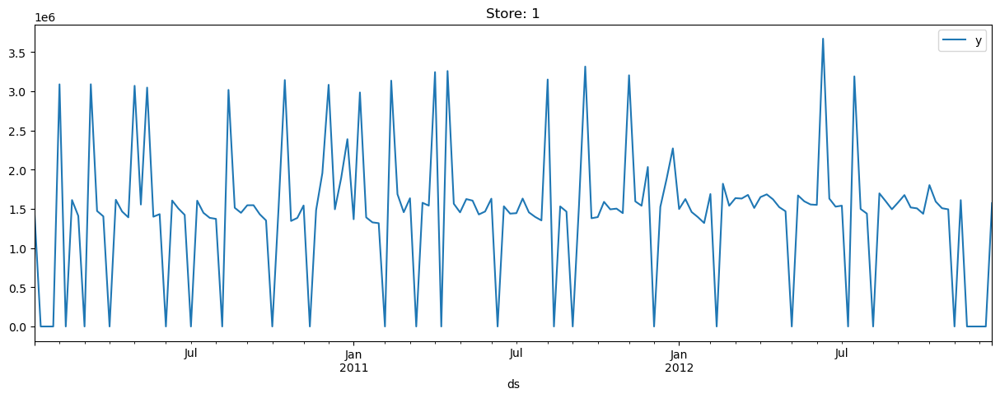

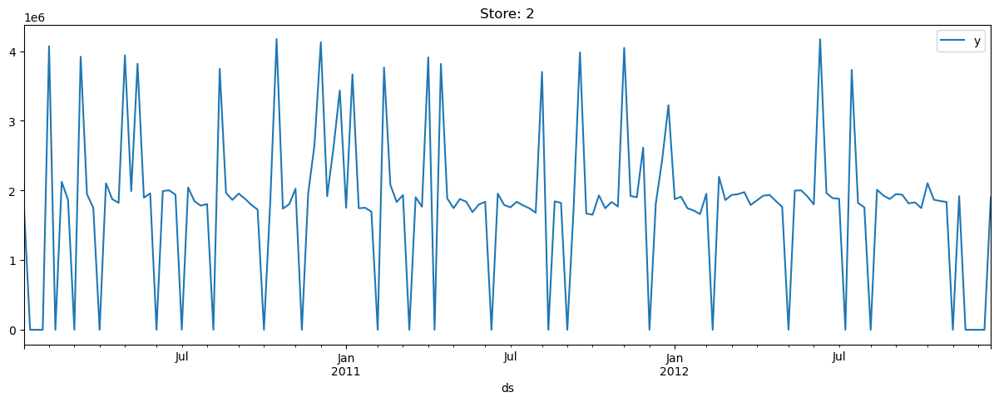

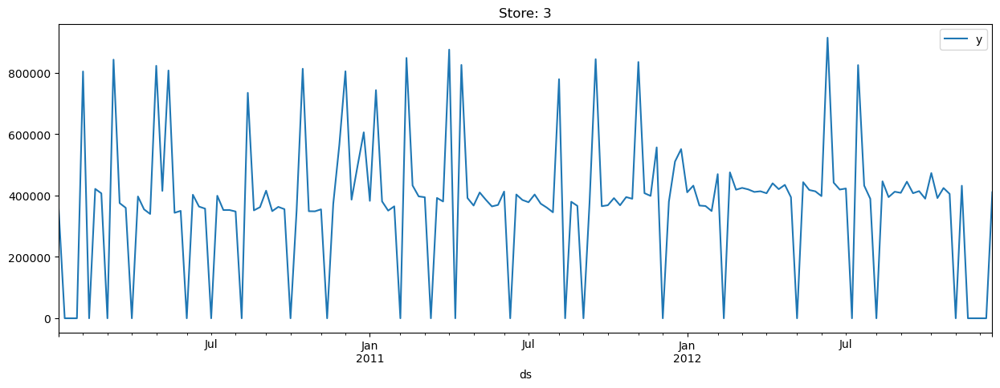

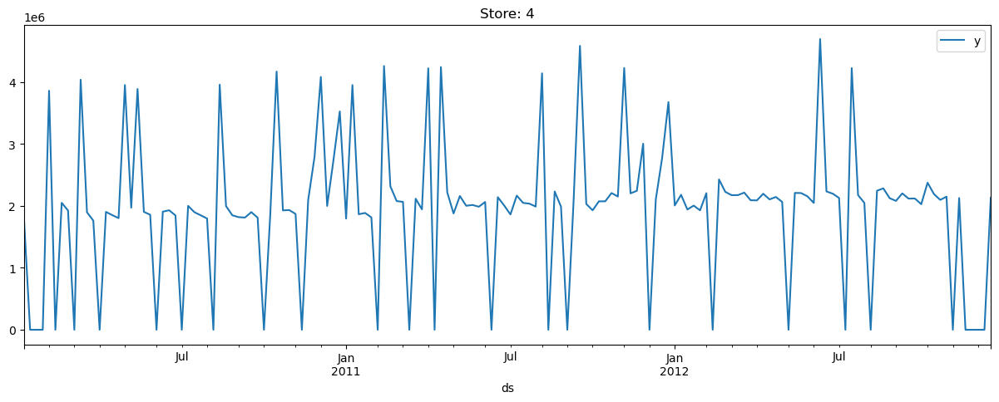

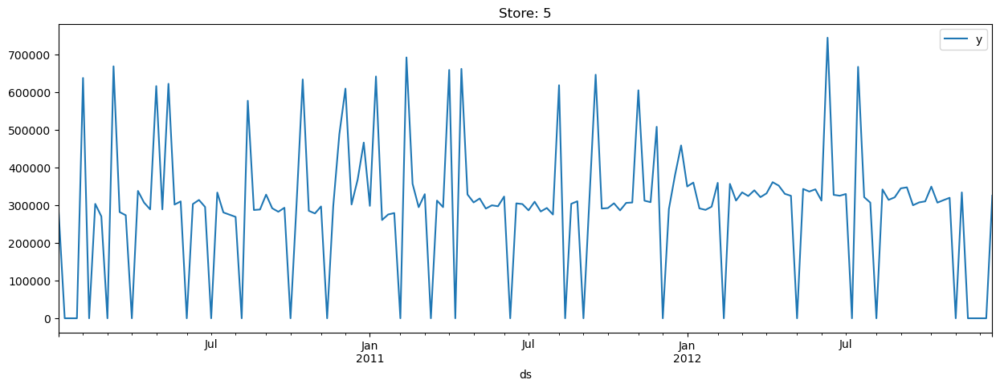

...

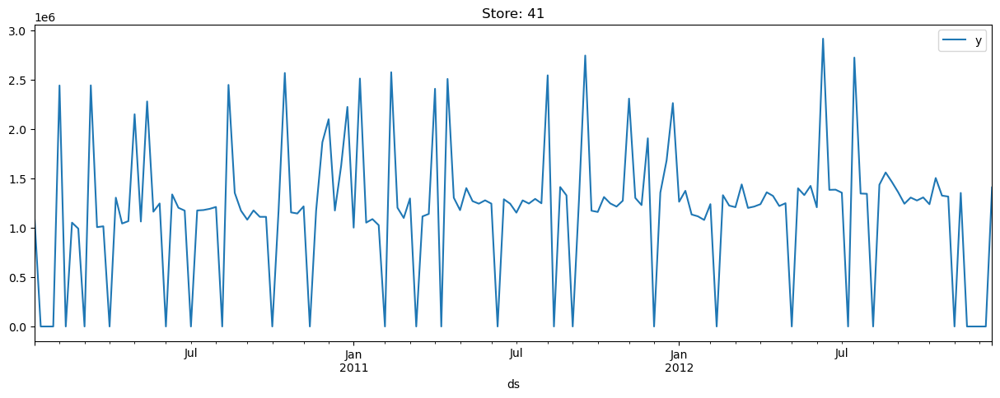

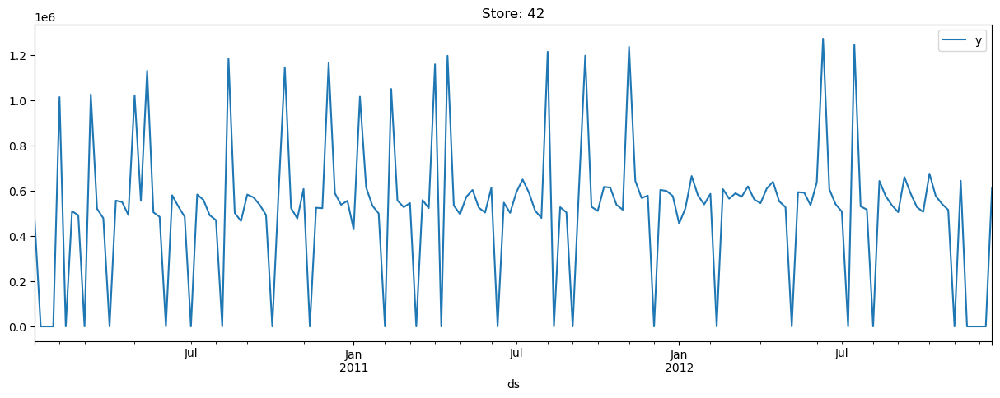

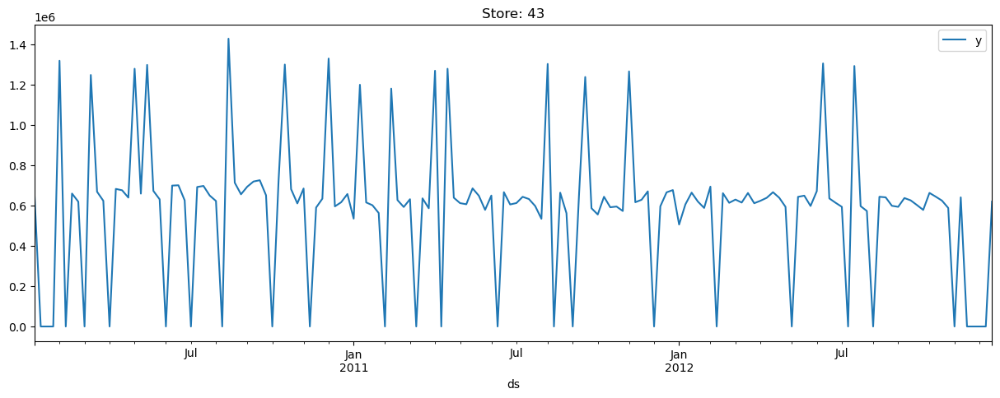

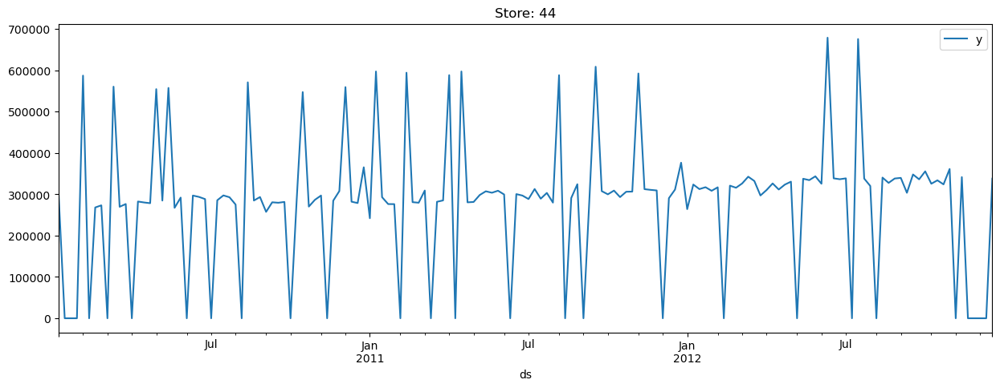

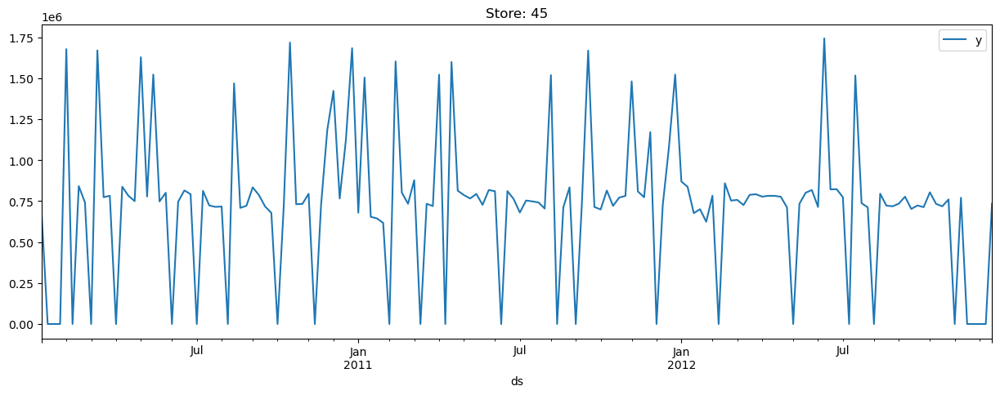

In [107]:
# lets plot each branch data to find any discripency
for i in store_list:
    fig,ax = plt.subplots(figsize=(15,5))
    dfx = df_weekly.query('ID==@i')
    dfx.plot(x='ds',y='y',ax=ax,title='Store: '+i)
    plt.plot()

After resampling the data, we can see there are no holiday spikes, and the data is more consistent. 

In [108]:
%%time
METRICS = ["MAE", "RMSE"]
METRICS_VAL = ["MAE_val", "RMSE_val"]
params = {"seasonality_mode": "multiplicative", "learning_rate": 0.01}

folds = NeuralProphet(**params).crossvalidation_split_df(df_weekly, freq="W", k=5, fold_pct=0.20, fold_overlap_pct=0.5)
metrics_train = pd.DataFrame(columns=METRICS)
metrics_test = pd.DataFrame(columns=METRICS_VAL)

for df_train, df_test in folds:
    m = NeuralProphet(**params)
    m.set_plotting_backend("matplotlib")
    train = m.fit(df=df_train, freq="W")
    test = m.test(df=df_test)

    train_df1 = train[['MAE', 'RMSE']].iloc[-1] if 'MAE' in train.columns else pd.Series([np.nan, np.nan], index=METRICS)
    test_df1 = test[['MAE_val', 'RMSE_val']].iloc[-1] if 'MAE_val' in test.columns else pd.Series([np.nan, np.nan], index=METRICS_VAL)
    
    # Append the metrics to the respective DataFrames
    metrics_train = pd.concat([metrics_train, pd.DataFrame([train_df1])], ignore_index=True)
    metrics_test = pd.concat([metrics_test, pd.DataFrame([test_df1])], ignore_index=True)

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

WARNING - (py.warnings._showwarnmsg) - <timed exec>:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

WARNING - (py.warnings._showwarnmsg) - <timed exec>:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.09877468645572662
         MAE_val            0.38527244329452515
        RMSE_val            0.44453099370002747
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test          0.031972285360097885
         MAE_val            0.1681877076625824
        RMSE_val            0.2528417408466339
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.01907718926668167
         MAE_val            0.11638610064983368
        RMSE_val            0.19532987475395203
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.0375814363360405
         MAE_val            0.19090765714645386
        RMSE_val            0.27403759956359863
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.05275903642177582
         MAE_val            0.28773099184036255
        RMSE_val            0.3247503936290741
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
CPU times: user 1min 34s, sys: 714 ms, total: 1min 35s
Wall time: 1min 35s


In [109]:
# First model
metrics_train

,MAE,RMSE
0,0.199621,0.273613
1,0.194459,0.273073
2,0.183624,0.270298
3,0.182612,0.257026
4,0.174397,0.252152


In [110]:
metrics_test

,MAE_val,RMSE_val
0,0.385272,0.444531
1,0.168188,0.252842
2,0.116386,0.195330
3,0.190908,0.274038
4,0.287731,0.324750


#### Proceeding to next step:
Hyperparameter tuning
Here I added some new parametrs and changed old parameters and also, i added early stopping to the model, so it stops training when it sees no growth in the accuracy. 

In [111]:
%%time
METRICS = ["MAE", "RMSE"]
METRICS_VAL = ["MAE_val", "RMSE_val"]
# new params, changed the learning rate, added yearly seasonality, changes, seasonality mode
params = {"seasonality_mode": "additive", 
          "learning_rate": 0.001,
         'yearly_seasonality': True}

folds = NeuralProphet(**params).crossvalidation_split_df(df_weekly, freq="W", k=5, fold_pct=0.20, fold_overlap_pct=0.5)
metrics_train2 = pd.DataFrame(columns=METRICS)
metrics_test2 = pd.DataFrame(columns=METRICS_VAL)

for df_train, df_test in folds:
    m = NeuralProphet(**params)
    m.set_plotting_backend("matplotlib")
    train = m.fit(df=df_train, freq="W",early_stopping=True)
    test = m.test(df=df_test)

    train_df1 = train[['MAE', 'RMSE']].iloc[-1] if 'MAE' in train.columns else pd.Series([np.nan, np.nan], index=METRICS)
    test_df1 = test[['MAE_val', 'RMSE_val']].iloc[-1] if 'MAE_val' in test.columns else pd.Series([np.nan, np.nan], index=METRICS_VAL)
    
    # Append the metrics to the respective DataFrames
    metrics_train2 = pd.concat([metrics_train2, pd.DataFrame([train_df1])], ignore_index=True)
    metrics_test2 = pd.concat([metrics_test2, pd.DataFrame([test_df1])], ignore_index=True)

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

WARNING - (py.warnings._showwarnmsg) - <timed exec>:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

WARNING - (py.warnings._showwarnmsg) - <timed exec>:23: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test            0.29999840259552
         MAE_val            0.6947335004806519
        RMSE_val            0.7845604419708252
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.04477551579475403
         MAE_val            0.23099930584430695
        RMSE_val            0.2991872727870941
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.03290017694234848
         MAE_val            0.17120563983917236
        RMSE_val            0.2565114200115204
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.04391349107027054
         MAE_val            0.20811651647090912
        RMSE_val            0.2963559627532959
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test          0.044749245047569275
         MAE_val            0.2547421455383301
        RMSE_val            0.29909175634384155
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
CPU times: user 1min 40s, sys: 686 ms, total: 1min 41s
Wall time: 1min 41s


In [112]:
#second model
metrics_train2

,MAE,RMSE
0,0.198868,0.264801
1,0.195934,0.267269
2,0.189210,0.264499
3,0.185695,0.263347
4,0.175883,0.255940


In [113]:
metrics_test2

,MAE_val,RMSE_val
0,0.694734,0.784560
1,0.230999,0.299187
2,0.171206,0.256511
3,0.208117,0.296356
4,0.254742,0.299092


#### Review: 
Based on the reuslts of our two different models, used, 
second model performed well compared to the first one. 
It might be because since we gave lower learning rate and also we added yearly_seasonality component to the model which might have helped in understnading the seasonality of the data well, because from the plots we can see during decembers there is high peak compared to other months. 

Now since we have got some information on the model parameters and figured out some good parameters, we will proceed forward to building full model and make predictions. 

In [114]:
# base model - used for splitting data
m_g = NeuralProphet()
m_g.set_plotting_backend('matplotlib')

In [115]:
# split data
dfw_train_g, dfw_test_g = m_g.split_df(df_weekly[['ID','ds','y']],valid_p=0.3,local_split=True)
dfw_val_g, dfw_test_g = m_g.split_df(dfw_test_g[['ID','ds','y']],valid_p=0.6,local_split=True)

print('Global data: ',df_weekly.shape)
print('Train data: ',dfw_train_g.shape)
print('Validation data: ',dfw_val_g.shape)
print('Test data: ',dfw_test_g.shape)

Global data:  (6930, 3)
Train data:  (4860, 3)
Validation data:  (855, 3)
Test data:  (1215, 3)


In [116]:
print('Train',dfw_train_g.ds.min(),dfw_train_g.ds.max())
print('Validation',dfw_val_g.ds.min(),dfw_val_g.ds.max())
print('Test',dfw_test_g.ds.min(),dfw_test_g.ds.max())

Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Validation 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00


In [117]:
# Confirming if the dates are clear between the dataset splits. 
# In timeseries models, we do not want any leakage of data among the splits.
branches = df_weekly.ID.unique()
for i in branches:
    print('Branch: ',i)
    df_tr = dfw_train_g.query('ID==@i')
    df_v = dfw_val_g.query('ID==@i')
    df_te = dfw_test_g.query('ID==@i')

    print('Train',df_tr.ds.min(),df_tr.ds.max())
    print('Val',df_v.ds.min(),df_v.ds.max())
    print('Test',df_te.ds.min(),df_te.ds.max())

Branch:  1
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00
Branch:  10
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00
Branch:  11
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00
Branch:  12
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00
Branch:  13
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00
Branch:  14
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 00:00:00 2012-12-16 00:00:00
Branch:  15
Train 2010-01-10 00:00:00 2012-01-29 00:00:00
Val 2012-02-05 00:00:00 2012-06-10 00:00:00
Test 2012-06-17 0

#### Review:
The datasplits are correct

In [145]:
%%time
# model HP
params = {"seasonality_mode": "additive", 
          "learning_rate": 0.001,
         'yearly_seasonality': True}
m1 = NeuralProphet(**params)
m1.set_plotting_backend('matplotlib')
set_random_seed(1)
metrics_m1 = m1.fit(dfw_train_g,validation_df=dfw_val_g)

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

CPU times: user 23.5 s, sys: 366 ms, total: 23.8 s
Wall time: 23.8 s


In [146]:
# test
testMetrics_m1 = m1.test(dfw_test_g)
testMetrics_m1

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.04117024689912796
         MAE_val            0.1949813961982727
        RMSE_val            0.28693872690200806
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


,MAE_val,RMSE_val,Loss_test,RegLoss_test
0,0.194981,0.286939,0.04117,0.0


Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/neuralprophet/plot_forecast_matplotlib.py:318: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst["ds"].dt.to_pydatetime()



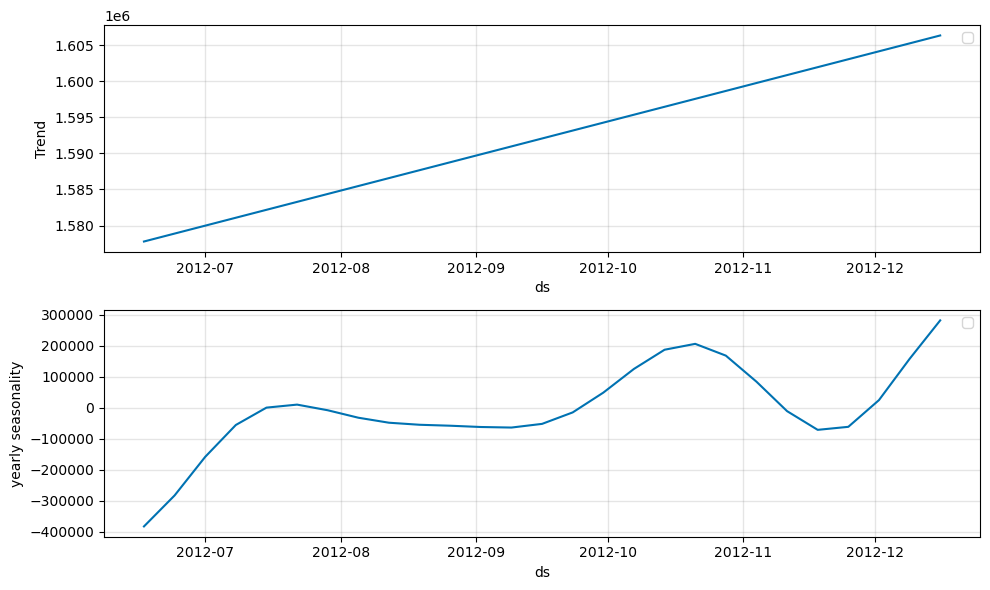

In [147]:
# Forecast one single branch
forecast_m1 = m1.predict(dfw_test_g)
m1.plot_components(forecast_m1.query('ID=="1"'))

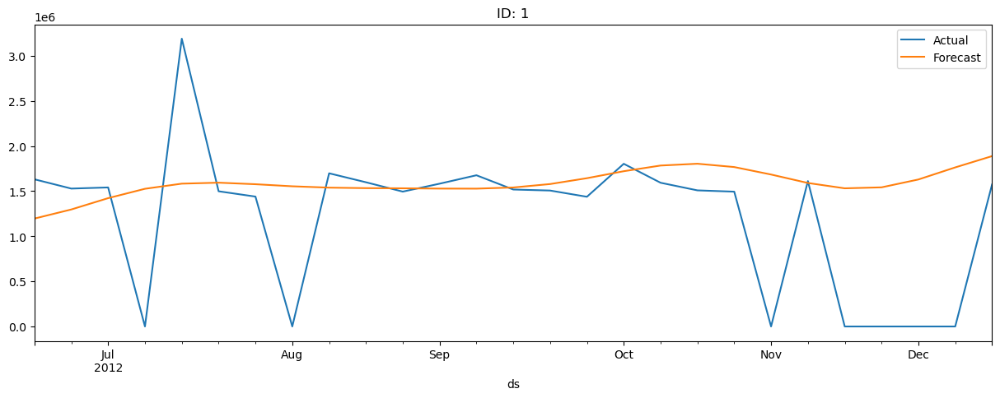

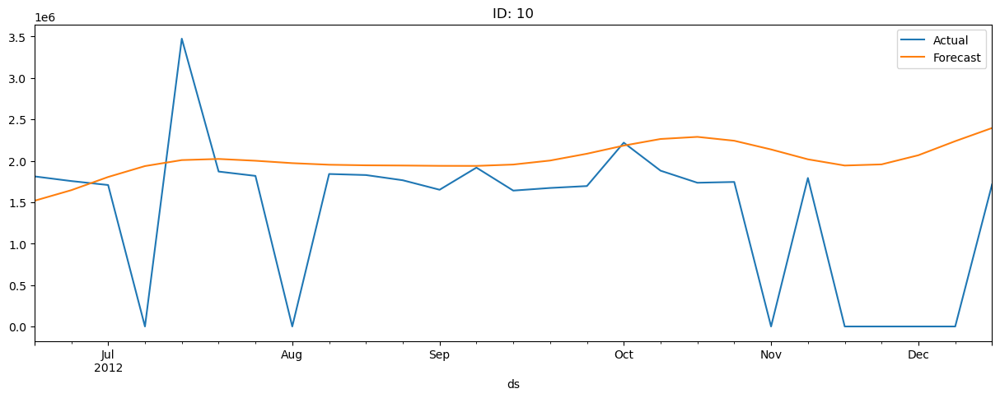

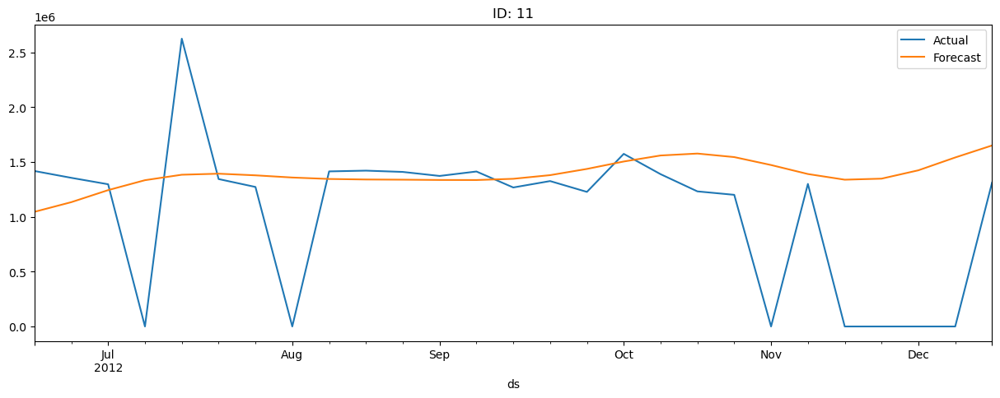

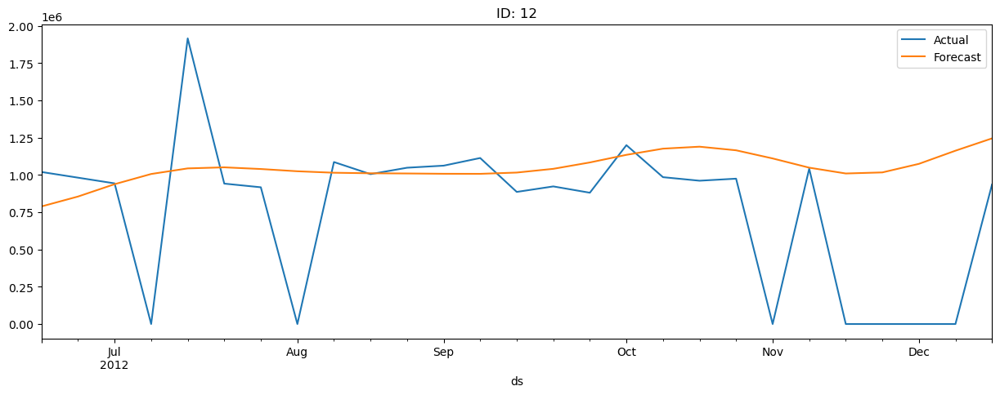

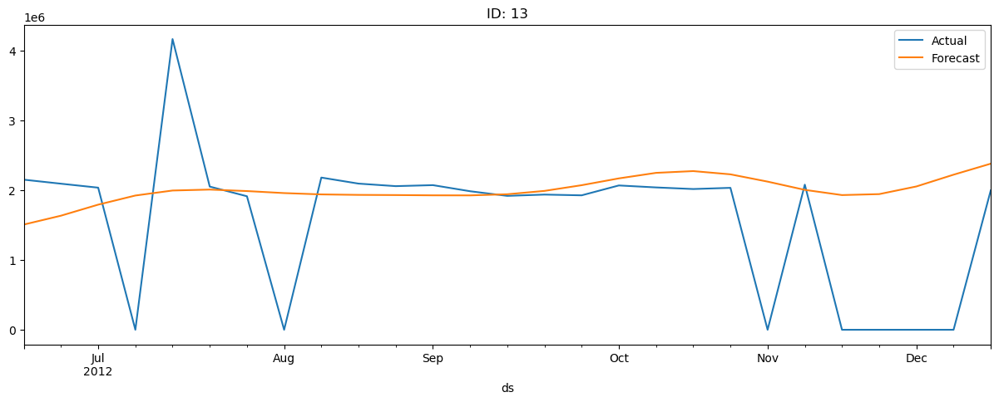

...

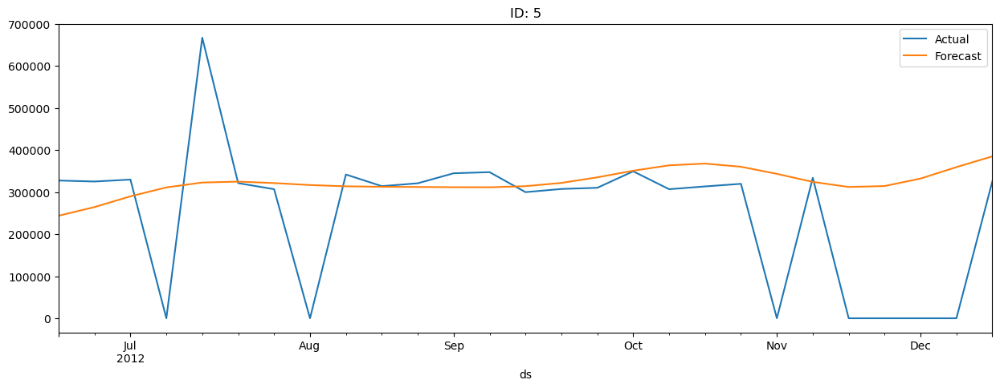

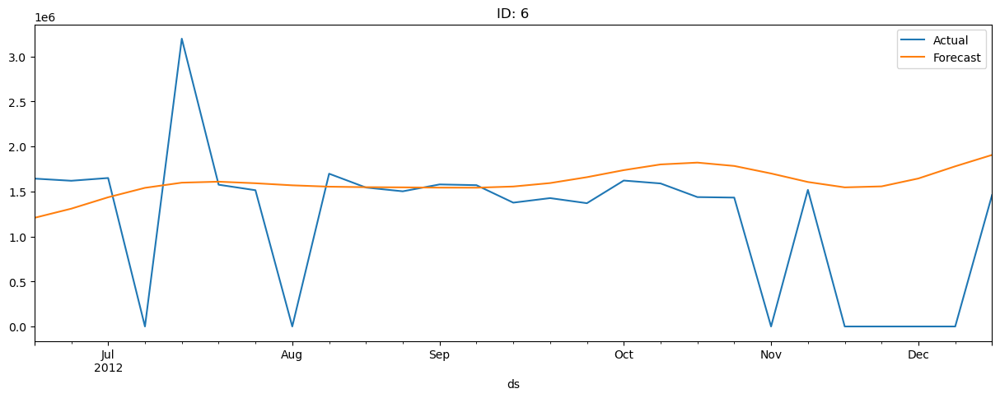

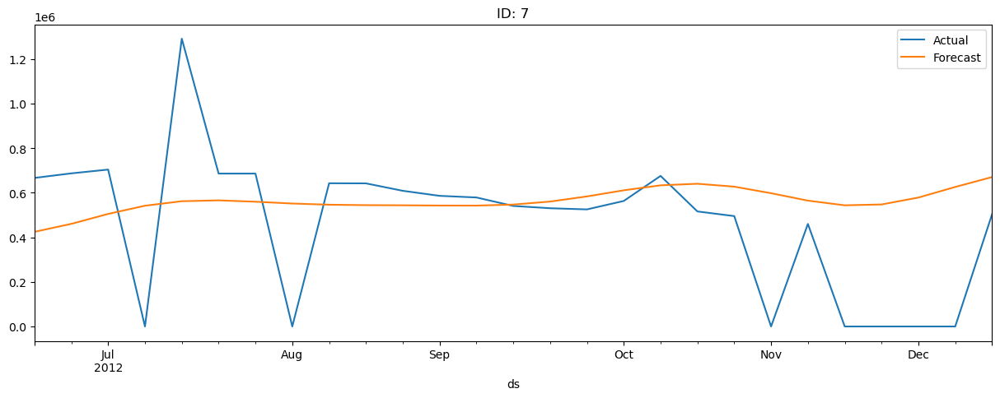

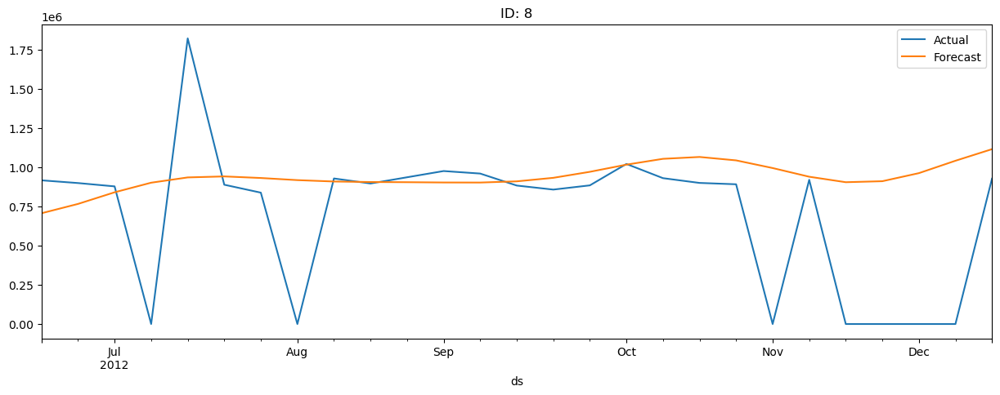

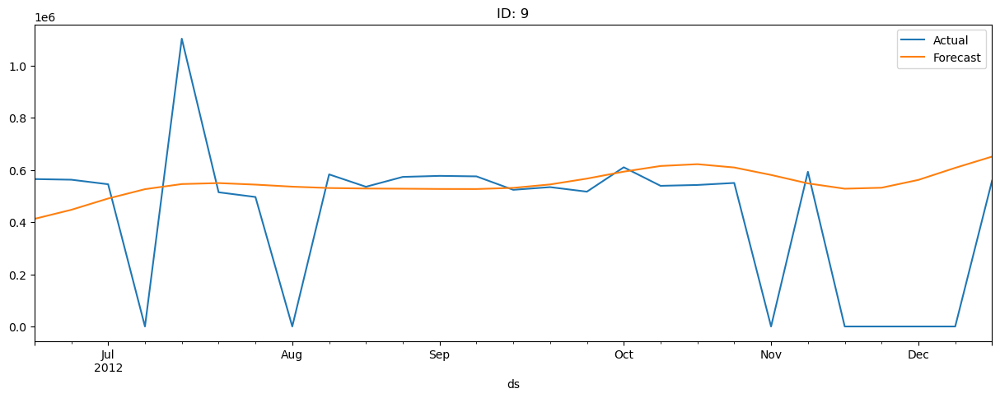

In [148]:
# Plot Actual vs Predicted
branch = dfw_train_g.ID.unique()

for id in branch:
    df = forecast_m1.query('ID==@id')
    fig, ax = plt.subplots(figsize=(15, 5))
    df.plot(x='ds', y='y', ax=ax, label='Actual')
    df.plot(x='ds', y='yhat1', ax=ax, label='Forecast')
    ax.set_title(f"ID: {id}")  # Set the title correctly using parentheses
    plt.legend()  #  add a legend 
    plt.show()  # Display the plot

#### Next step:
Propose ways to increase perfromance. 
- As we can see from the above results, the forecast line is pretty good but it did not grasp the trend points accuretly. So for this we can give trend components parameter and train the model. 

In [138]:
%%time
# NP-model2
# model HP 
# adding trend change points
params = {"seasonality_mode": "additive", 
          "learning_rate": 0.001,
         'yearly_seasonality': True,
          'n_changepoints':15
         }
m2 = NeuralProphet(**params)
m2.set_plotting_backend('matplotlib')
set_random_seed(1)
metrics_m2 = m2.fit(dfw_train_g,validation_df=dfw_val_g)

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

CPU times: user 23.6 s, sys: 369 ms, total: 23.9 s
Wall time: 23.9 s


In [139]:
# test
testMetrics_m2 = m2.test(dfw_test_g)
testMetrics_m2

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.04804474860429764
         MAE_val            0.21533071994781494
        RMSE_val            0.3099782168865204
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


,MAE_val,RMSE_val,Loss_test,RegLoss_test
0,0.215331,0.309978,0.048045,0.0


Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

Predicting: 152it [00:00, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/neuralprophet/plot_forecast_matplotlib.py:318: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst["ds"].dt.to_pydatetime()



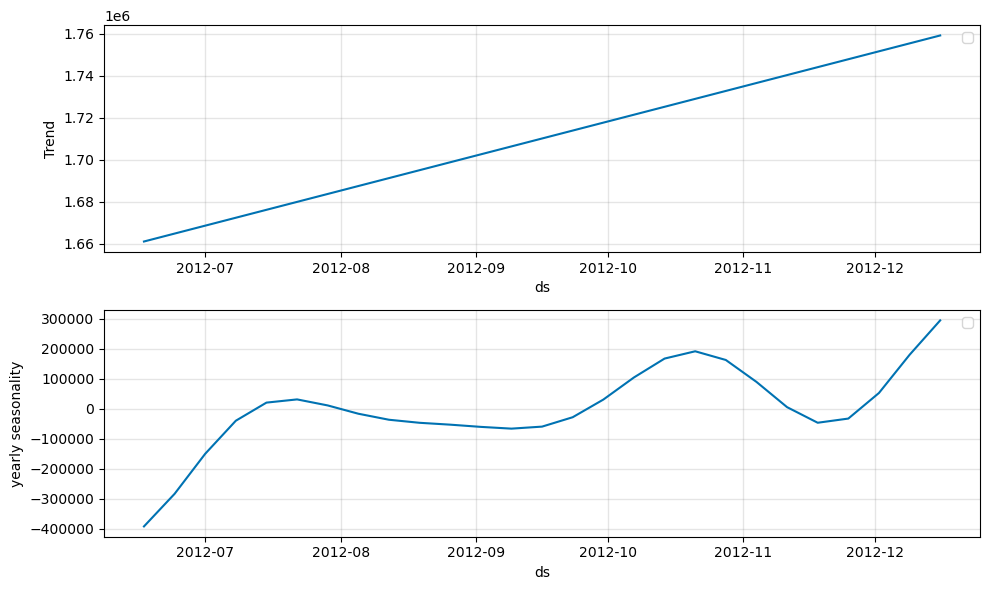

In [140]:
# Forecast one single branch
forecast_m2 = m2.predict(dfw_test_g)
m2.plot_components(forecast_m2.query('ID=="1"'))

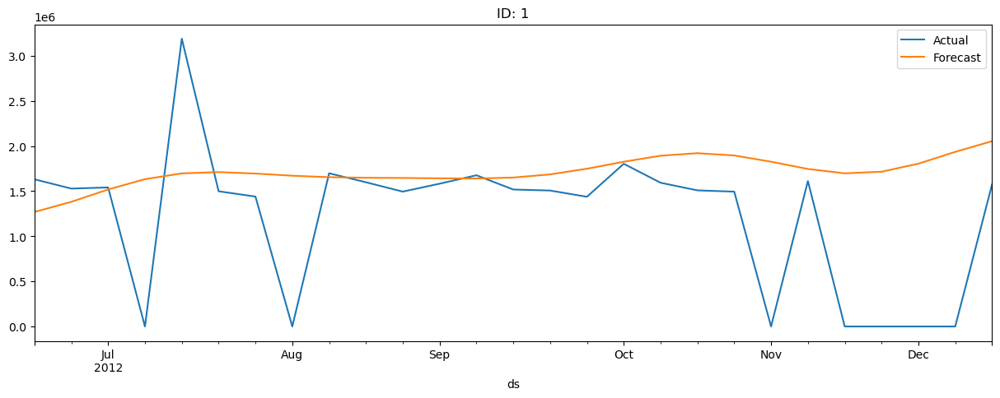

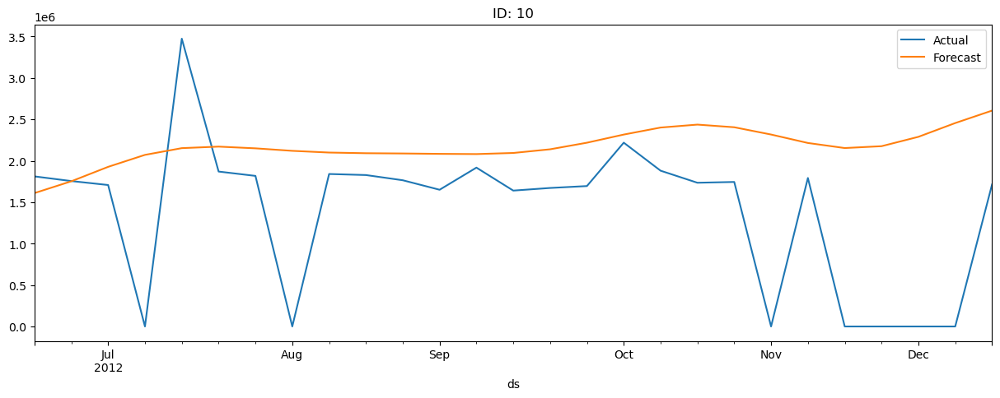

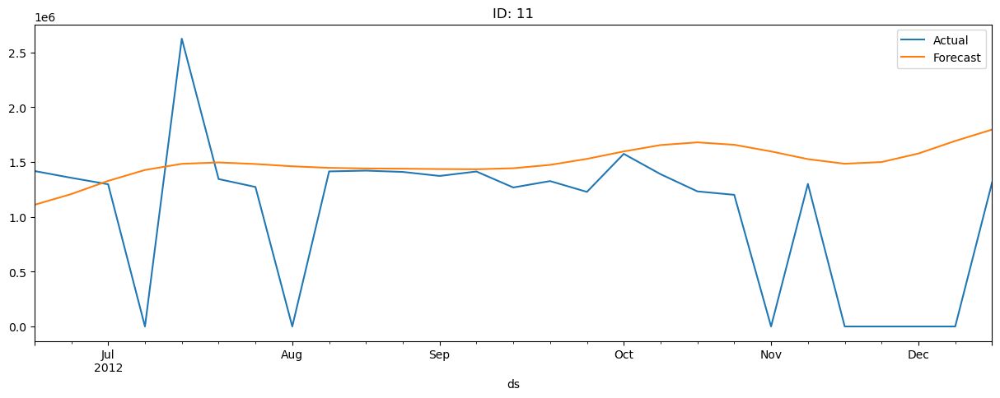

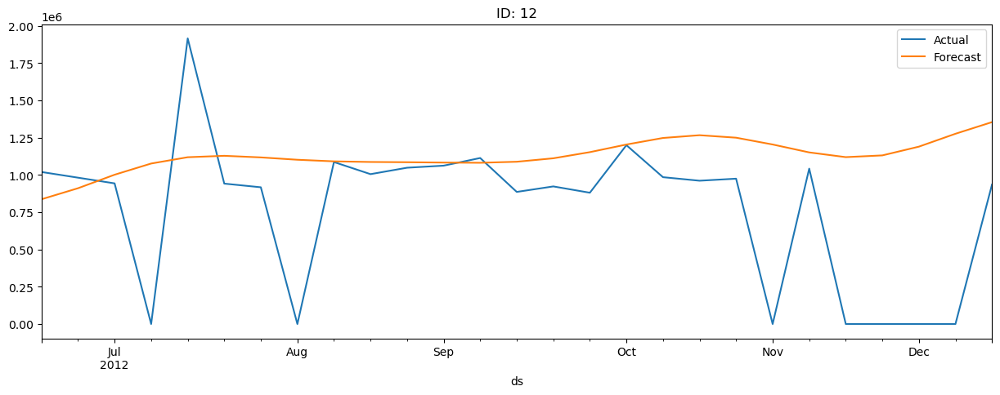

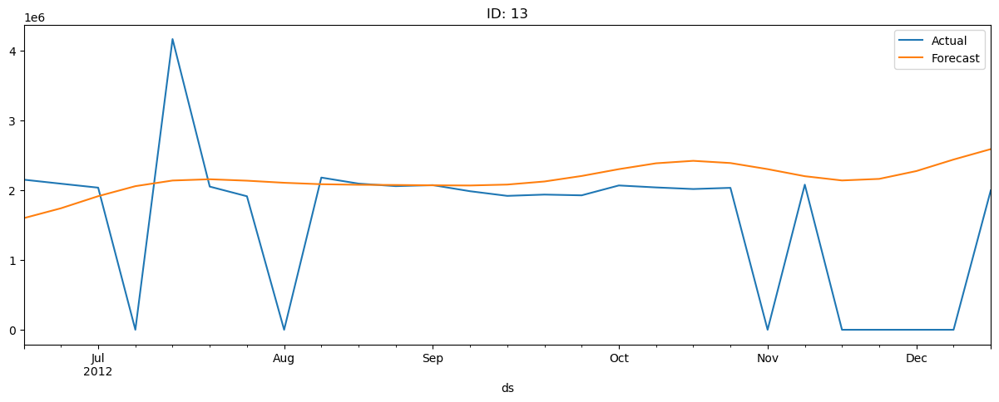

...

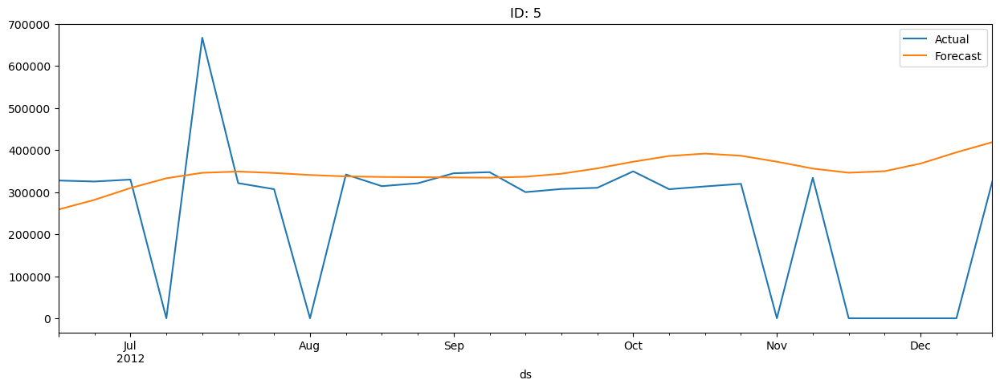

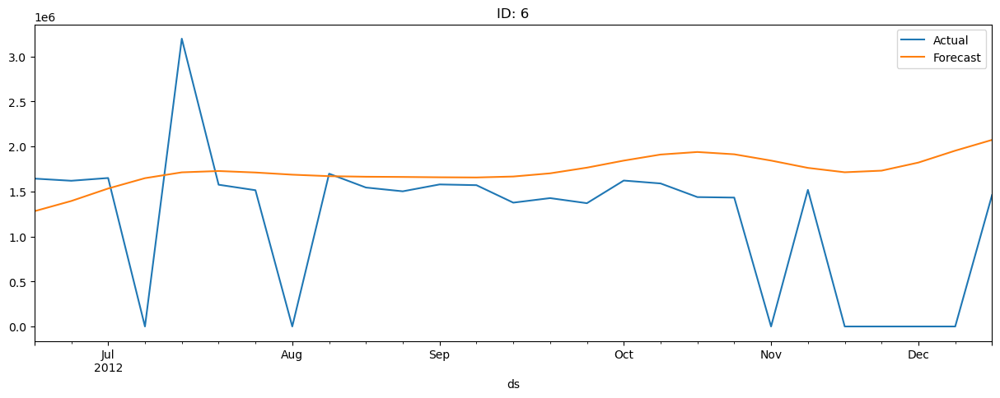

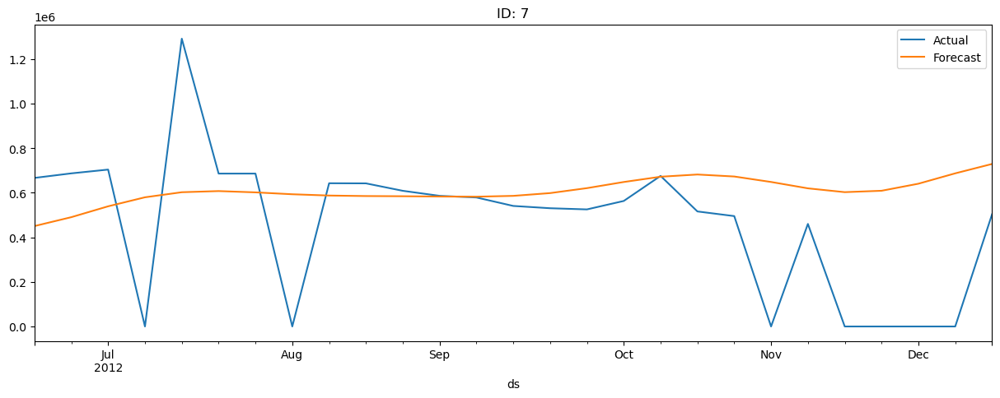

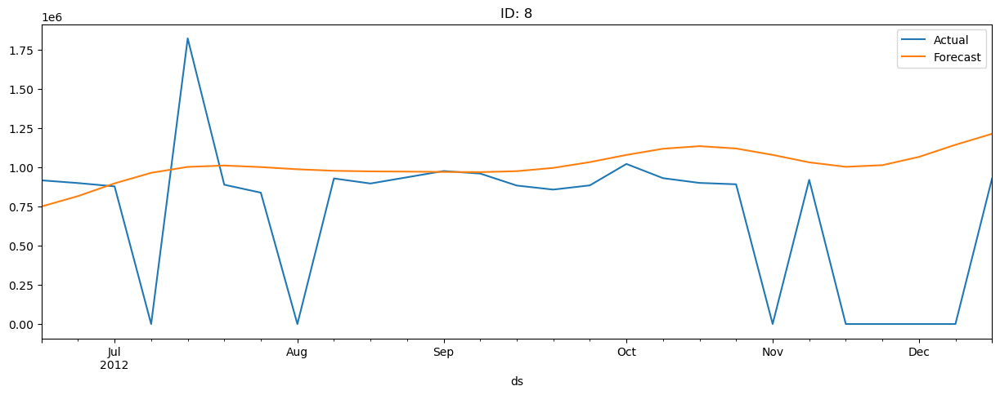

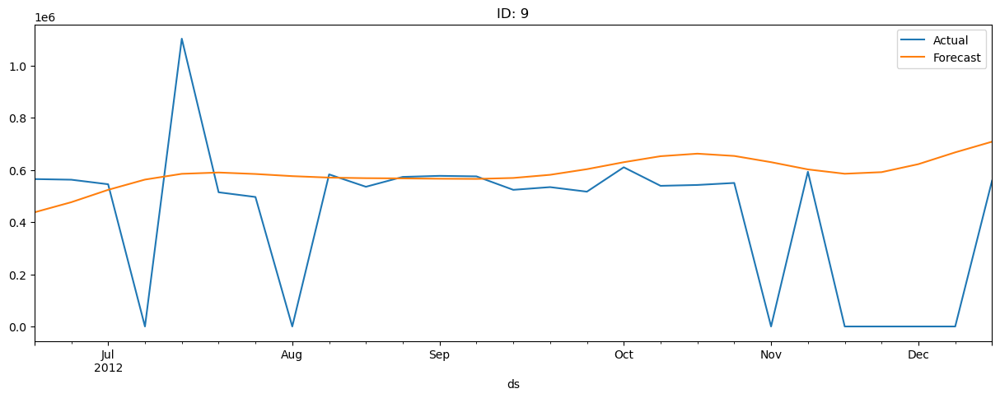

In [141]:
# Plot Actual vs Predicted
branch = dfw_train_g.ID.unique()

for id in branch:
    df = forecast_m2.query('ID==@id')
    fig, ax = plt.subplots(figsize=(15, 5))
    df.plot(x='ds', y='y', ax=ax, label='Actual')
    df.plot(x='ds', y='yhat1', ax=ax, label='Forecast')
    ax.set_title(f"ID: {id}")  # Set the title correctly using parentheses
    plt.legend()  #  add a legend 
    plt.show()  # Display the plot

#### Review:
Adding trend change points, did not improve efficiency, it instead decreased the efficiency by a bit/ 
- In model we will try to use auto regressors, so that, the model will use n previous data points, to predict future.
- For this AR model, we need to find out what is the best Auto regression value. So since until now model is performing good, we will use model 1 to calculate the auto regressor value. 

<Axes: title={'center': 'Residual for NP-model1'}, xlabel='ds'>

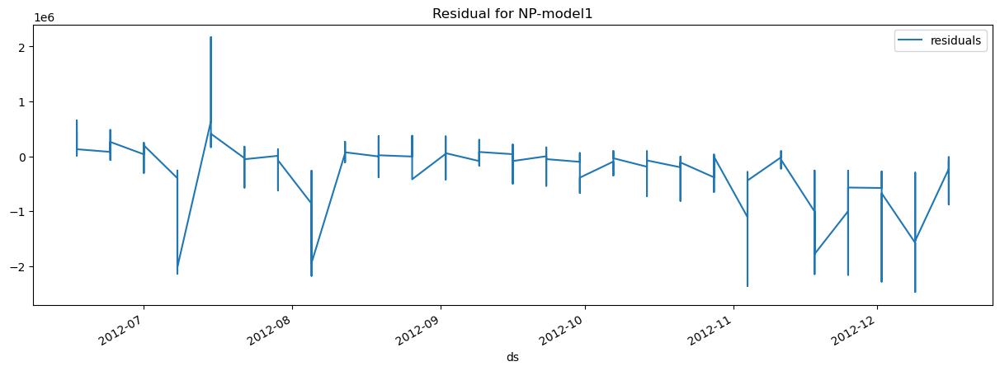

In [150]:
# Plot residuals
fig, ax = plt.subplots(figsize=(15,5))
df_residuals = pd.DataFrame({"ds": forecast_m1["ds"], "residuals": forecast_m1["y"] - forecast_m1["yhat1"]})
df_residuals.plot(x='ds',y='residuals',title='Residual for NP-model1',ax=ax)

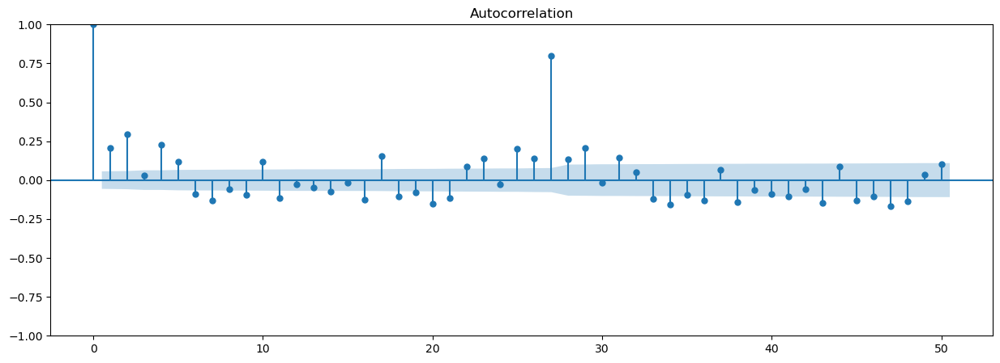

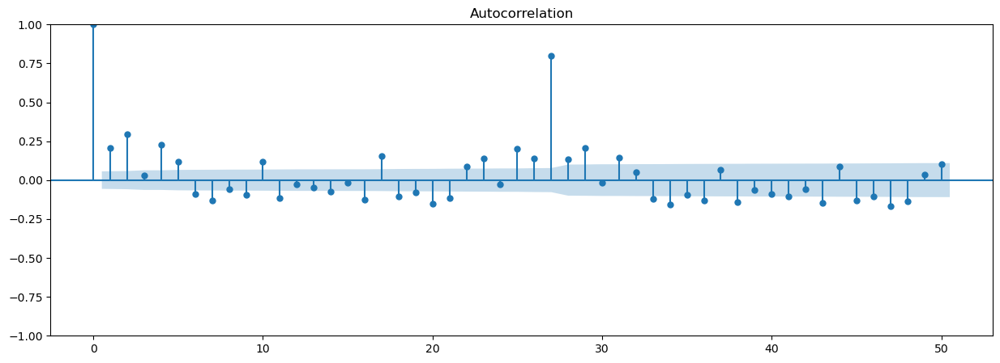

In [152]:
# Plot ACF
fig , ax = plt.subplots(figsize=(15,5))
plot_acf(df_residuals['residuals'],lags=50,ax=ax)

#### Review: 
Since ours is a weekly data, we can see we have almost 52 weeks spikes which indicate almost a year. 
We have our significant spike at first point which indicate our 1st week data has significant impact on the model . But first spike is common in Timeseries data. 
But our next significant spike is at 24 wihci might indicate almost half a year. 
But since considering model complexity and computational limitations we will not consider 24 lag points now. 
Next for the first couple of weeks we can see the spike is decreased but again it rise at point 10. 
So, for now, lets consider n_lags = 10 (weeks) and check the restuls



In [165]:
%%time
# NP-model3

# model HP
# adding auto regression
params = {"seasonality_mode": "additive", 
          "learning_rate": 0.001,
         'yearly_seasonality': True,
         'n_lags':10}
m3 = NeuralProphet(**params)
m3.set_plotting_backend('matplotlib')
set_random_seed(1)
metrics_m3 = m3.fit(dfw_train_g,validation_df=dfw_val_g)

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

CPU times: user 28.5 s, sys: 388 ms, total: 28.8 s
Wall time: 28.8 s


In [166]:
# test
testMetrics_m3 = m3.test(dfw_test_g)
testMetrics_m3

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Loss_test           0.07190036028623581
         MAE_val            0.34425607323646545
        RMSE_val            0.3792106509208679
      RegLoss_test                  0.0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


,MAE_val,RMSE_val,Loss_test,RegLoss_test
0,0.344256,0.379211,0.0719,0.0


WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/neuralprophet/data/split.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_i = pd.concat([df_i, future_df])

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/neuralprophet/data/split.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_i = pd.concat([df_i, future_df])

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/mini

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

Predicting: 138it [00:00, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/neuralprophet/plot_forecast_matplotlib.py:318: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst["ds"].dt.to_pydatetime()

WARNING - (py.warnings._showwarnmsg) - /Users/santosh/miniconda3/envs/NPcopy/lib/python3.10/site-packages/neuralprophet/plot_forecast_matplotlib.py:410: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst["ds"].dt.to_pydatetime()



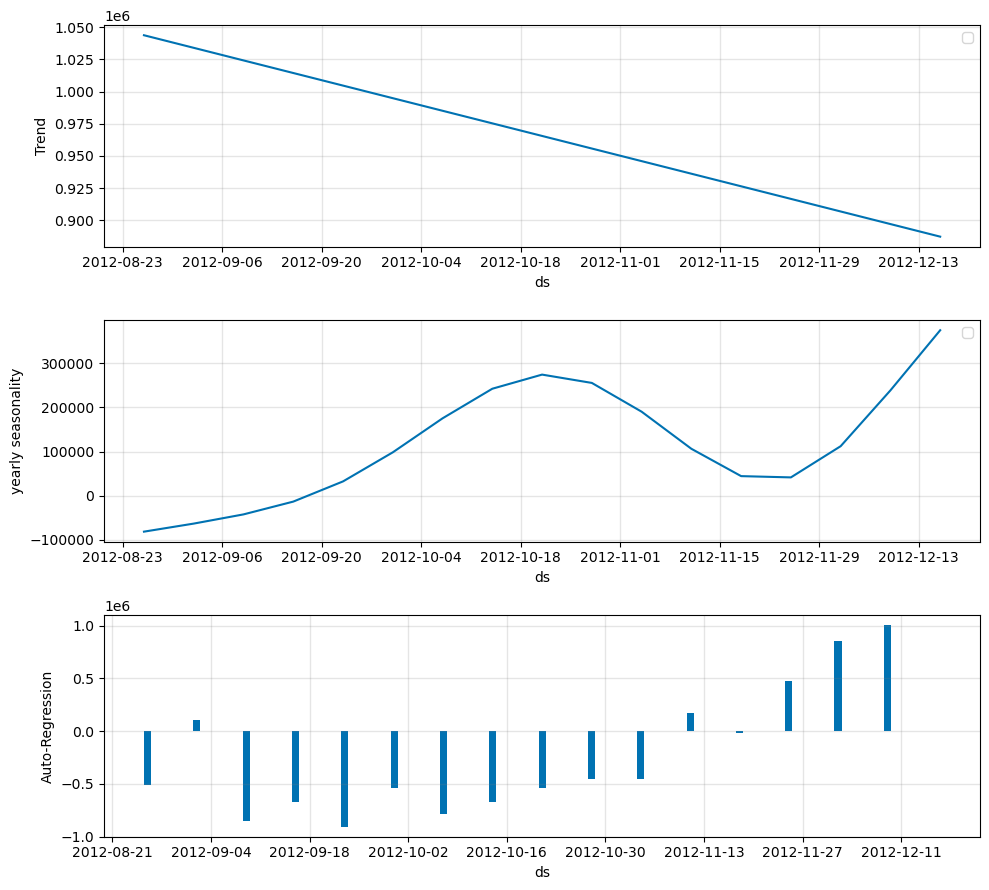

In [167]:
# Forecast one single branch
forecast_m3 = m3.predict(dfw_test_g)
m3.plot_components(forecast_m3.query('ID=="1"'))

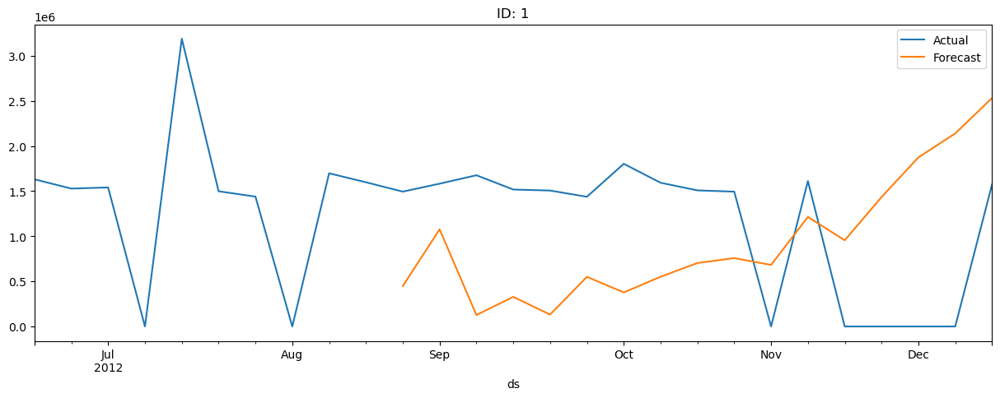

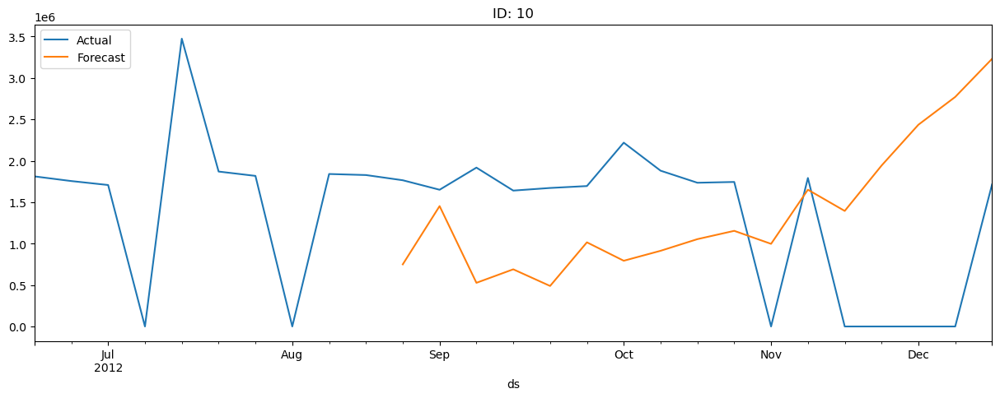

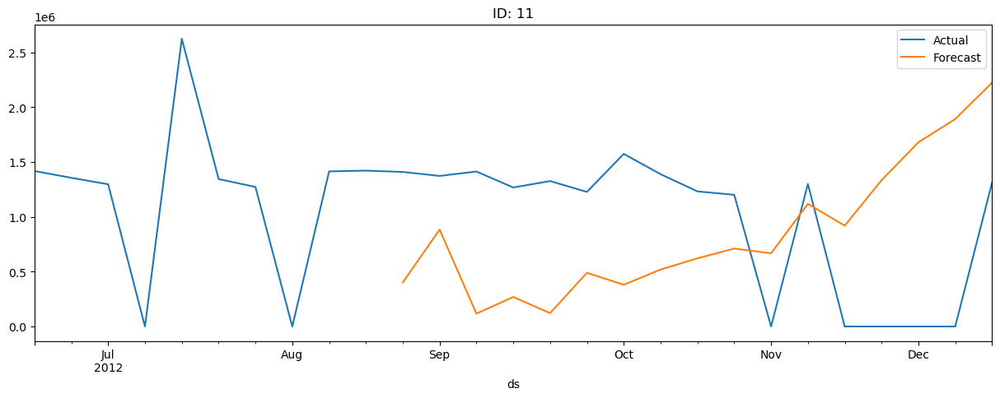

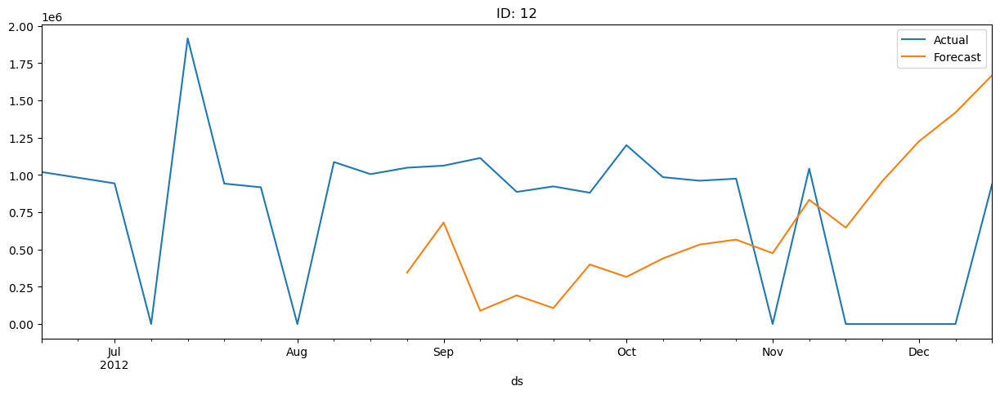

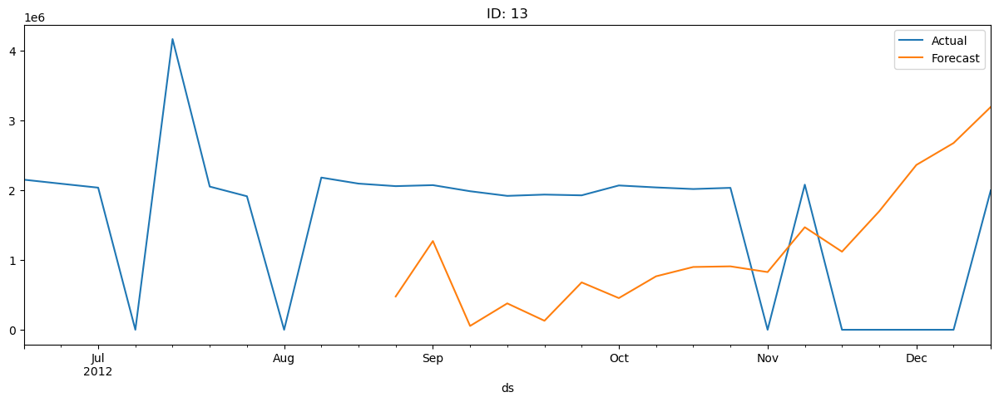

...

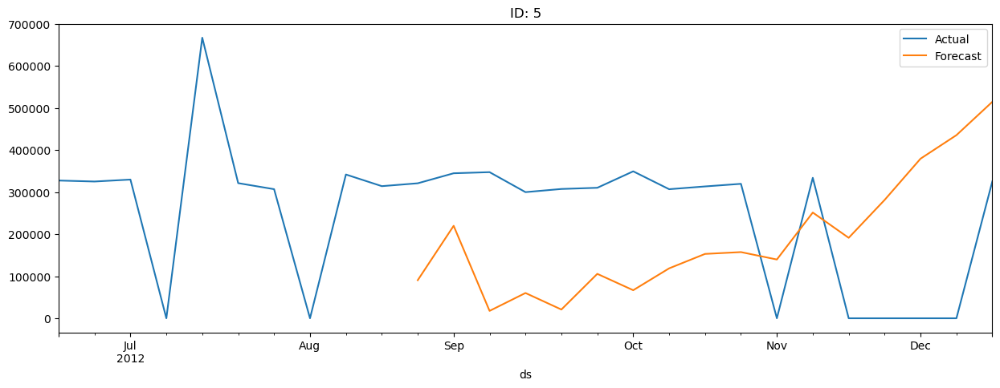

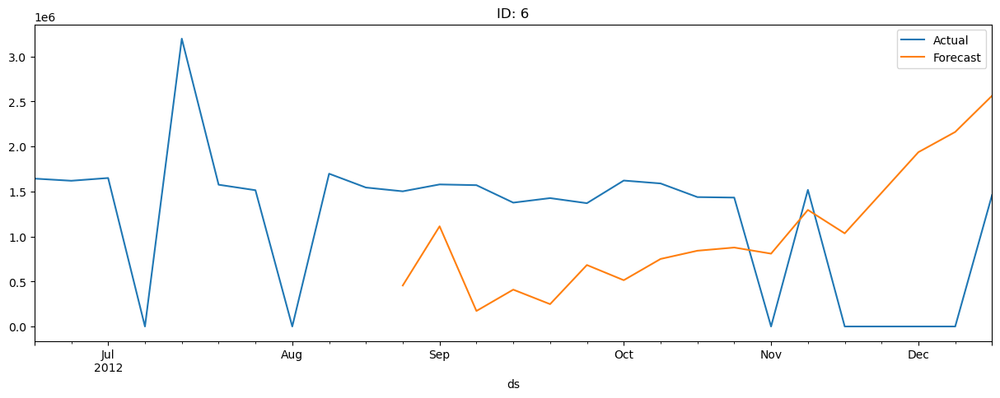

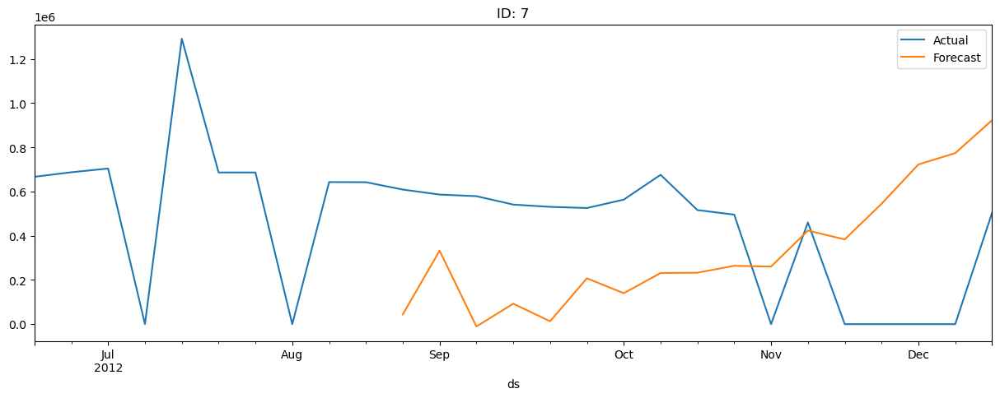

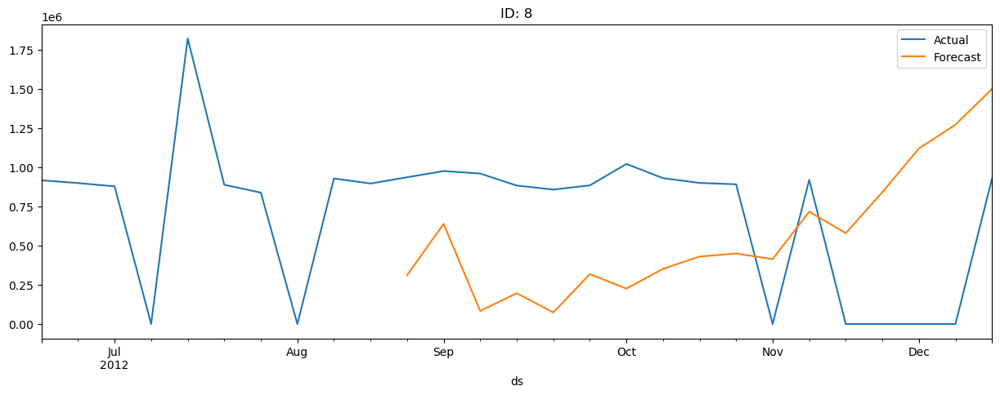

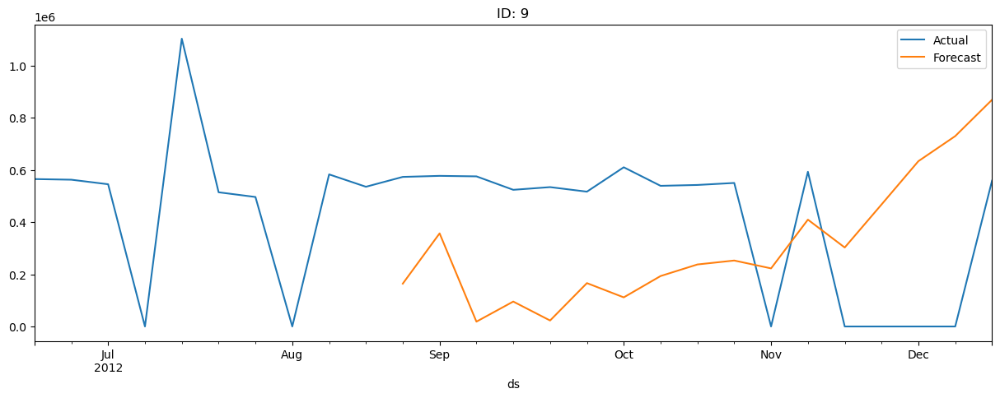

In [168]:
# Plot Actual vs Predicted
branch = dfw_train_g.ID.unique()

for id in branch:
    df = forecast_m3.query('ID==@id')
    fig, ax = plt.subplots(figsize=(15, 5))
    df.plot(x='ds', y='y', ax=ax, label='Actual')
    df.plot(x='ds', y='yhat1', ax=ax, label='Forecast')
    ax.set_title(f"ID: {id}")  # Set the title correctly using parentheses
    plt.legend()  #  add a legend 
    plt.show()  # Display the plot

#### Review:
Since we are giving n_lags=10, our model cannot test first n obersavations. 

In [169]:
# Check results of 3 NP models
combined_testMetrics = pd.concat([testMetrics_m1, testMetrics_m2, testMetrics_m3], keys=['m1', 'm2', 'm3'])


In [170]:
combined_testMetrics

,,MAE_val,RMSE_val,Loss_test,RegLoss_test
m1,0,0.194981,0.286939,0.041170,0.0
m2,0,0.215331,0.309978,0.048045,0.0
m3,0,0.344256,0.379211,0.071900,0.0


#### Review:
As you can observe here, despite our efforts to increase model efficiency, model1 has given best results until now.
Until now, we have done:
- Try to visulaize data and do dimentionality reduction techniques such as PCA, UMAP, t-SNE.
- Use Time series Cross validation (CV) strategy
- Use Random Forest (RF) model as a simple basic starting step of our project.
- Use CV for RF and also Fine tune RF.
- Use Neural Prophet (NP) model as our advanced model in this project.
- Use CV for NP and also Fine tune NP.
- Propose ways to improve NP model efficiency.
- Conducted further 2 more experiments to test results. 

#### Future enhancements:
- Until now, we are manually playing with parameters which is a much time consuming process especially for complex models like Neural Prophet.
- To further fine tune the model, we can make use of HyperOPT.
- Using Hyperopt is a more efficient and sophisticated method for hyperparameter tuning compared to a manual search. Hyperopt uses Bayesian optimization for hyperparameter tuning, which means it tries to find the best hyperparameters based on the results of previous iterations, rather than exhaustively searching the entire space. This usually results in finding better hyperparameters with fewer iterations.
- But because of computer limitations, we will not be doing that for now and leave it for further studies. 

## End of Project
## Thank you